# EDA Project -  King County Housing Data

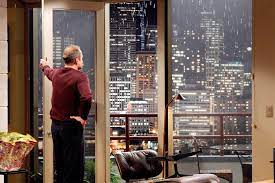

## Preparations
First I import all required libraries and define some initial settings.

In [1]:
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import missingno as msno

# For calculating the distance between two geo-locations 
import haversine as hs   
from haversine import Unit


from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

I load the data into a DataFrame.

In [2]:
df_start = pd.read_csv("data/King_County_House_prices_dataset.csv")

Check if the data loaded correctly.

In [3]:
df_start.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,NaN,0.000,...,7,1180,0.0,1955,0.000,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0.000,0.000,...,7,2170,400.0,1951,1991.000,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0.000,0.000,...,6,770,0.0,1933,NaN,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0.000,0.000,...,7,1050,910.0,1965,0.000,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0.000,0.000,...,8,1680,0.0,1987,0.000,98074,47.617,-122.045,1800,7503


## 1. Understanding
Browse the data, columns and data types check your domain knowledge

In [4]:
df_start.head().loc[:, :"view"]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,NaN,0.000
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0.000,0.000
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0.000,0.000
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0.000,0.000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0.000,0.000


In [5]:
df_start.head().loc[:, "condition":]

,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,3,7,1180,0.0,1955,0.000,98178,47.511,-122.257,1340,5650
1,3,7,2170,400.0,1951,1991.000,98125,47.721,-122.319,1690,7639
2,3,6,770,0.0,1933,NaN,98028,47.738,-122.233,2720,8062
3,5,7,1050,910.0,1965,0.000,98136,47.521,-122.393,1360,5000
4,3,8,1680,0.0,1987,0.000,98074,47.617,-122.045,1800,7503


In [6]:
df_start.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [7]:
df_start.shape

(21597, 21)

In [8]:
df_start.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

#### To examine
date: the date is saved as an string -> date object  
bathrooms: Number of bathrooms is float -> int. Wy is it decimal number?  
floors: Number of floors -> there are half floors?  
waterfront: 0 when no waterfront? Some Null values.  
view: float, could be int? Number of views? Some Nulls.  
condition: categorical -> check the ranking  
grade: categorical -> check the ranking  
sqft_basement: string -> there are some ? to be converted.  
yr_built: int -> Date  
yr_renovated: float -> Date. Some Nulls and many zeros  
zipcode: check format -> should have same number of digits?  




In [9]:
df_start.nunique()

id               21420
date               372
price             3622
bedrooms            12
bathrooms           29
sqft_living       1034
sqft_lot          9776
floors               6
waterfront           2
view                 5
condition            5
grade               11
sqft_above         942
sqft_basement      304
yr_built           116
yr_renovated        70
zipcode             70
lat               5033
long               751
sqft_living15      777
sqft_lot15        8682
dtype: int64

In [10]:
df_start.bedrooms.value_counts().sort_index()

bedrooms
1      196
2     2760
3     9824
4     6882
5     1601
6      272
7       38
8       13
9        6
10       3
11       1
33       1
Name: count, dtype: int64

In [11]:
df_start.bathrooms.value_counts().sort_index()

bathrooms
0.500       4
0.750      71
1.000    3851
1.250       9
1.500    1445
1.750    3048
2.000    1930
2.250    2047
2.500    5377
2.750    1185
3.000     753
3.250     589
3.500     731
3.750     155
4.000     136
4.250      79
4.500     100
4.750      23
5.000      21
5.250      13
5.500      10
5.750       4
6.000       6
6.250       2
6.500       2
6.750       2
7.500       1
7.750       1
8.000       2
Name: count, dtype: int64

Internet research:
A full bathroom is made up of four parts: **a sink, a shower, a bathtub, and a toilet**. Anything less than that, and you can't officially consider it a full bath. The math is simple: Each utility is counted as one-quarter, so you add and deduct a quarter for each one, as the case may be.
(https://www.realtor.com/advice/sell/if-i-take-out-the-tub-does-a-bathroom-still-count-as-a-full-bath/#:~:text=A%20full%20bathroom%20is%20made,as%20the%20case%20may%20be.)

In [12]:
df_start.floors.value_counts().sort_index()

floors
1.000    10673
1.500     1910
2.000     8235
2.500      161
3.000      611
3.500        7
Name: count, dtype: int64

There are some houses with half floors (mezzanine): is an intermediate floor in a building which is partly open to the double-height ceilinged floor below, or which does not extend over the whole floorspace of the building

In [13]:
df_start.waterfront.value_counts().sort_index()

waterfront
0.000    19075
1.000      146
Name: count, dtype: int64

Could be integer. Some missing values.

In [14]:
df_start.view.value_counts().sort_index()

view
0.000    19422
1.000      330
2.000      957
3.000      508
4.000      317
Name: count, dtype: int64

In [15]:
df_start.view.mean()

0.23386272870808952

Most of the houses were sold without having been viewed. That is strange.

In [16]:
df_start.condition.value_counts().sort_index()

condition
1       29
2      170
3    14020
4     5677
5     1701
Name: count, dtype: int64

In [17]:
df_start.grade.value_counts().sort_index()

grade
3        1
4       27
5      242
6     2038
7     8974
8     6065
9     2615
10    1134
11     399
12      89
13      13
Name: count, dtype: int64

In [18]:
df_start.sqft_basement.value_counts().sort_index()

sqft_basement
0.0       12826
10.0          2
100.0        42
1000.0      148
1008.0        1
          ...  
960.0        65
970.0        44
980.0        57
990.0        52
?           454
Name: count, Length: 304, dtype: int64

Replace "?" with "not_known".
Maybe create column "has_basement".

In [19]:
df_start[["sqft_above"]].query("sqft_above == 0").count()

sqft_above    0
dtype: int64

In [20]:
df_start.yr_renovated.value_counts().sort_index()

yr_renovated
0.000       17011
1934.000        1
1940.000        2
1944.000        1
1945.000        3
            ...  
2011.000        9
2012.000        8
2013.000       31
2014.000       73
2015.000       14
Name: count, Length: 70, dtype: int64

In [21]:
df_start.yr_renovated.isnull().sum()

3842

The time between sale and built or renovated would be interesting.

In [22]:
df_start.zipcode.value_counts().sort_index()

zipcode
98001    361
98002    199
98003    280
98004    317
98005    168
        ... 
98177    255
98178    262
98188    136
98198    280
98199    317
Name: count, Length: 70, dtype: int64

In [23]:
df_start[["sqft_living15"]].query("sqft_living15 == 0").count()


sqft_living15    0
dtype: int64

In [24]:
df_start[["sqft_lot15"]].query("sqft_lot15 == 0").count()

sqft_lot15    0
dtype: int64

In [25]:
df_start.describe()[["sqft_living15","sqft_lot15"]]

,sqft_living15,sqft_lot15
count,21597.000,21597.000
mean,1986.620,12758.284
std,685.230,27274.442
min,399.000,651.000
25%,1490.000,5100.000
50%,1840.000,7620.000
75%,2360.000,10083.000
max,6210.000,871200.000


In [26]:
df_start.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,19221.000,21534.000,21597.000,21597.000,21597.000,21597.000,17755.000,21597.000,21597.000,21597.000,21597.000,21597.000
mean,4580474287.771,540296.574,3.373,2.116,2080.322,15099.409,1.494,0.008,0.234,3.410,7.658,1788.597,1971.000,83.637,98077.952,47.560,-122.214,1986.620,12758.284
std,2876735715.748,367368.140,0.926,0.769,918.106,41412.637,0.540,0.087,0.766,0.651,1.173,827.760,29.375,399.946,53.513,0.139,0.141,685.230,27274.442
min,1000102.000,78000.000,1.000,0.500,370.000,520.000,1.000,0.000,0.000,1.000,3.000,370.000,1900.000,0.000,98001.000,47.156,-122.519,399.000,651.000
25%,2123049175.000,322000.000,3.000,1.750,1430.000,5040.000,1.000,0.000,0.000,3.000,7.000,1190.000,1951.000,0.000,98033.000,47.471,-122.328,1490.000,5100.000
50%,3904930410.000,450000.000,3.000,2.250,1910.000,7618.000,1.500,0.000,0.000,3.000,7.000,1560.000,1975.000,0.000,98065.000,47.572,-122.231,1840.000,7620.000
75%,7308900490.000,645000.000,4.000,2.500,2550.000,10685.000,2.000,0.000,0.000,4.000,8.000,2210.000,1997.000,0.000,98118.000,47.678,-122.125,2360.000,10083.000
max,9900000190.000,7700000.000,33.000,8.000,13540.000,1651359.000,3.500,1.000,4.000,5.000,13.000,9410.000,2015.000,2015.000,98199.000,47.778,-121.315,6210.000,871200.000


#### Conclusions
date: the date is saved as an string -> date object  
bathrooms: Number of bathrooms is float -> int. 0.25 bathroom stands for the one of the 4 units: sink, toilet, bath, shower
floors: Number of floors -> there are half floors  
waterfront: 0 when no waterfront. Some Null values: replace with "not_known" 
view: float, could be int? Number of views. Some Nulls: replace with "not_known"  
condition: categorical -> check the ranking  
grade: categorical -> check the ranking  
sqft_basement: string -> there are some ? to be converted. Do I need this column?   
yr_built: int -> Date  
yr_renovated: float -> Date. Many zeros. Some Nulls: replace with "not_known"  
zipcode: right format 

### Missing values

In [27]:
df_start.isnull().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

- waterfront: maybe have a look at the latitude -> replace Null with 0 or 1. **Do I need this column?**
- view: replace with "not_known". **Do I need this column?**
- yr_renovated: replace with "not_known"

<Axes: >

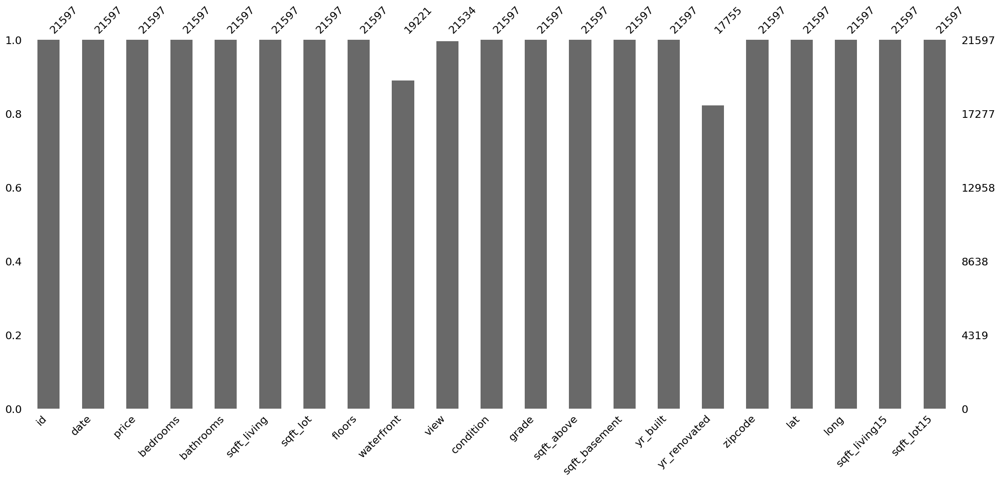

In [28]:
msno.bar(df_start)

<Axes: >

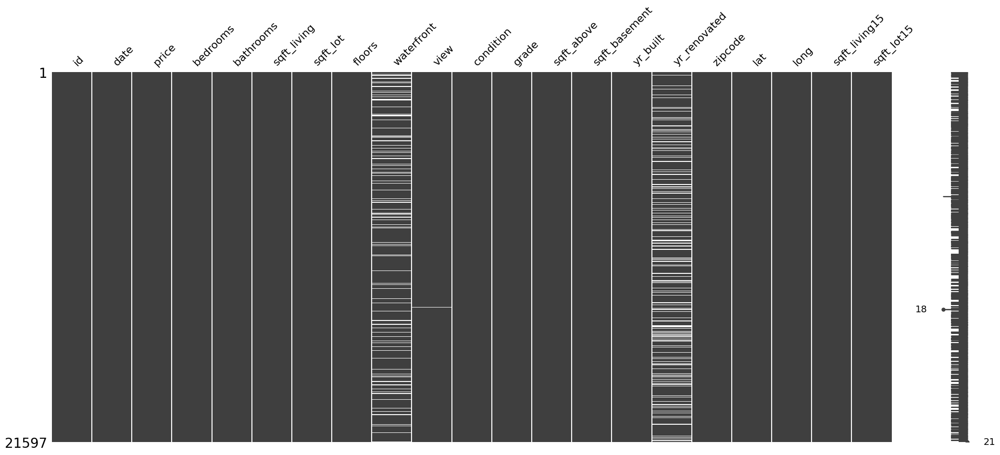

In [29]:
msno.matrix(df_start)

Let's have a closer look to the "yr_renovated" column.

In [30]:
df_start.yr_renovated.isnull().sum()/len(df_start)*100

17.78950780200954

So nearly 17.8 % of the data is missing.  
Let's search for a pattern.  
Maybe we get information out of the year the house is built or the condition ranking.

In [31]:
df_start[["condition","yr_built", "yr_renovated"]][df_start["yr_renovated"].isnull()].sort_values("yr_built").describe()

,condition,yr_built,yr_renovated
count,3842.000,3842.000,0.000
mean,3.406,1970.499,NaN
std,0.642,29.477,NaN
min,1.000,1900.000,NaN
25%,3.000,1950.000,NaN
50%,3.000,1974.000,NaN
75%,4.000,1996.000,NaN
max,5.000,2015.000,NaN


In [32]:
df_start[["condition","yr_built", "yr_renovated"]][df_start["yr_renovated"].isnull()].groupby("condition").count()

,yr_built,yr_renovated
condition,,
1,6,0
2,26,0
3,2495,0
4,1031,0
5,284,0


We can't see any patterns.

## 2. Research Questions and Hypothesis Generation


### Research Questions
- Are recently renovated houses more expansive?
- Are recently built houses more expansive?
- Does the grade based on King County grading system affect the price?
- Does the ranking of the condition affect the price?
- Are houses in the country, the city, the suburbs or the seaside more expansive?
- How have the prices changed over the last (5) years for houses in the country, the city, the suburbs or the seaside?
- How are the prices changing over one year (seasons) for houses in the country, the city, the suburbs or the seaside?

- Does the number of bathrooms increase the price?
- Does the footage of the living space (and the lot) increase the price?

### My hypothesis for William Rodriguez
William Rodriguez: 2 people, country (best timing & non-renovated) & city house (fast & central location), wants two houses  
   **(Buyer)**

Assumptions about requirements:
- middle - high price range
- middle - high house size
- young people: don't care about floors (and stairs)
- good condition and high quality
- don't care about basement
- country house should have big space outside
- prefer at least one full bathroom
- prefer at least 2 bedrooms (for future kids and guests)

Hypothesis

Country house:
- The closer a house in the country is to a city, the higher the price.
- The prices for houses in the country are higher in the summer.
- The prices for houses in the country are decreasing in the last years.
- The more recent a house was built or renovated the higher the price.
- The better the condition of a (non-renovated) house is, the higher the price
- The more recent a house was built or renovated the better the condition is.  
    
 City house:   
- The closer a house is located to the city center, the higher the price.
- The prices for houses in the city are higher in the winter.
- Houses with a full bathroom are more expansive.
- The closer a house is located to the city center, the smaller the footage of living space is.
    - The closer a house is located to the city center, the smaller the number of bathrooms.  


## 3. Clean the Data
deal with missing values, why are they missing? extreme values..
are they really outliers


#### Drop Columns
Since we are not interested in all the columns, we can drop some of these to make our exploration easier.

We first make a copy of our DataFrame.



In [33]:
df = df_start.copy()
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,NaN,0.000,...,7,1180,0.0,1955,0.000,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0.000,0.000,...,7,2170,400.0,1951,1991.000,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0.000,0.000,...,6,770,0.0,1933,NaN,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0.000,0.000,...,7,1050,910.0,1965,0.000,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0.000,0.000,...,8,1680,0.0,1987,0.000,98074,47.617,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.000,3,2.500,1530,1131,3.000,0.000,0.000,...,8,1530,0.0,2009,0.000,98103,47.699,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.000,4,2.500,2310,5813,2.000,0.000,0.000,...,8,2310,0.0,2014,0.000,98146,47.511,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.000,2,0.750,1020,1350,2.000,0.000,0.000,...,7,1020,0.0,2009,0.000,98144,47.594,-122.299,1020,2007
21595,291310100,1/16/2015,400000.000,3,2.500,1600,2388,2.000,NaN,0.000,...,8,1600,0.0,2004,0.000,98027,47.535,-122.069,1410,1287


Since the columns "view" and "waterfront" have missing values and aren't needed for the assumption we made for our client, we can drop them.

In [34]:
df = df.drop(["view","waterfront"],axis=1)

Our client doesn't care about the basement and the number of floors, so we can drop the columns.

In [35]:
df = df.drop(["floors","sqft_above","sqft_basement"],axis=1)

In [36]:
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,condition,grade,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,3,7,1955,0.000,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,3,7,1951,1991.000,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,3,6,1933,NaN,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,5,7,1965,0.000,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,3,8,1987,0.000,98074,47.617,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.000,3,2.500,1530,1131,3,8,2009,0.000,98103,47.699,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.000,4,2.500,2310,5813,3,8,2014,0.000,98146,47.511,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.000,2,0.750,1020,1350,3,7,2009,0.000,98144,47.594,-122.299,1020,2007
21595,291310100,1/16/2015,400000.000,3,2.500,1600,2388,3,8,2004,0.000,98027,47.535,-122.069,1410,1287


### Deal with duplicated rows
Let's check if we have duplicated rows (in all values in all columns)

In [37]:
df.duplicated().value_counts()

False    21597
Name: count, dtype: int64

Fine, we have no duplicated rows.  
But maybe there some houses that have been sold more than one time.

In [38]:
df["id"].duplicated().value_counts()

id
False    21420
True       177
Name: count, dtype: int64

We can see, that we have 177 duplicated rows. Let's have a look at the date of sale too.

In [39]:
df[["id","date"]].duplicated().value_counts()

False    21597
Name: count, dtype: int64

In [40]:
id_count = df.groupby("id")["date"].count()

So it seems that some houses have been sold more than one time.  
We can consider to save this number into a new column.

In [41]:
def get_num_sales(id):
    return id_count[id]

In [42]:
df["number_of_sales"] = df["id"].apply(get_num_sales)


In [43]:
df.number_of_sales.value_counts()

number_of_sales
1    21244
2      350
3        3
Name: count, dtype: int64

### Transforming data types and dealing with missing data
As mentioned above, we want to transform the dates into the right Date format.

In [44]:
df['date'] = pd.to_datetime(df['date'], dayfirst=True)

The year in the "yr_renovated" column is formatted as float. We want to have it as an integer.

In [45]:
# df["yr_renovated"] = df["yr_renovated"].apply(int)

Cannot convert float NaN to integer.  
We have to deal with the missing values first. 
As we saw above, there is no pattern in the missing data. Because we want to keep the data, we assume that a missing value is equal to the house is not renovated.  
So we replace the NaN values with 0.

In [46]:
df[["yr_renovated"]] = df[["yr_renovated"]].fillna(0)

Now we can transform the years into integers.

In [47]:
df["yr_renovated"] = df["yr_renovated"].apply(int)

In [48]:
df.dtypes

id                          int64
date               datetime64[ns]
price                     float64
bedrooms                    int64
bathrooms                 float64
sqft_living                 int64
sqft_lot                    int64
condition                   int64
grade                       int64
yr_built                    int64
yr_renovated                int64
zipcode                     int64
lat                       float64
long                      float64
sqft_living15               int64
sqft_lot15                  int64
number_of_sales             int64
dtype: object

Everything looks fine.

### New columns
We want to create a couple of new columns that can help us to explore the data in terms of our assumptions.

#### Months, years and season of sale

For getting a better understanding of the price changing over time and seasonality, we create new columns.

In [49]:
df["year_of_sale"] = df["date"].dt.year
df["month_of_sale"] = df["date"].dt.month
df["weekday_of_sale"] = df["date"].dt.dayofweek

In [50]:
seasons_dic = {1: "winter", 2: "winter", 3: "spring", 4: "spring", 5: "spring", 6: "summer", 7: "summer", 8: "summer", 9: "autumn", 10: "autumn", 11: "autumn", 12: "winter"}

In [51]:
df["season_of_sale"] = df["month_of_sale"].map(seasons_dic)

#### Renovated or not

We want to save if the houses is renovated or not.

In [52]:
df["is_renovated"] = df["yr_renovated"] != 0

And the years between the sale date and the renovation or the built year. 

In [53]:
df["years_between_sale_renovation_building"] = df["date"].dt.year - np.where(df["yr_renovated"] == 0, df["yr_built"], df["yr_renovated"])

In [54]:
df.query("years_between_sale_renovation_building == -1")[["date", "yr_built","yr_renovated","years_between_sale_renovation_building"]]

,date,yr_built,yr_renovated,years_between_sale_renovation_building
1761,2014-06-25,2015,0,-1
2293,2014-07-28,1922,2015,-1
2685,2014-10-29,2015,0,-1
7090,2014-10-28,1940,2015,-1
7519,2014-12-31,2015,0,-1
8032,2014-06-24,2015,0,-1
11587,2014-05-22,1923,2015,-1
14475,2014-08-26,2015,0,-1
14845,2014-06-06,1956,2015,-1
15673,2014-10-06,1955,2015,-1


In [55]:
rows_to_drop = df.query("year_of_sale < yr_built or year_of_sale < yr_renovated")[["date","year_of_sale", "yr_built","yr_renovated","years_between_sale_renovation_building"]].index

In [56]:
df.drop(rows_to_drop, axis=0, inplace=True)
df.reset_index(inplace=True)
df.drop("index", axis=1,inplace=True)

In [57]:
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,condition,grade,yr_built,...,long,sqft_living15,sqft_lot15,number_of_sales,year_of_sale,month_of_sale,weekday_of_sale,season_of_sale,is_renovated,years_between_sale_renovation_building
0,7129300520,2014-10-13,221900.000,3,1.000,1180,5650,3,7,1955,...,-122.257,1340,5650,1,2014,10,0,autumn,False,59
1,6414100192,2014-12-09,538000.000,3,2.250,2570,7242,3,7,1951,...,-122.319,1690,7639,1,2014,12,1,winter,True,23
2,5631500400,2015-02-25,180000.000,2,1.000,770,10000,3,6,1933,...,-122.233,2720,8062,1,2015,2,2,winter,False,82
3,2487200875,2014-12-09,604000.000,4,3.000,1960,5000,5,7,1965,...,-122.393,1360,5000,1,2014,12,1,winter,False,49
4,1954400510,2015-02-18,510000.000,3,2.000,1680,8080,3,8,1987,...,-122.045,1800,7503,1,2015,2,2,winter,False,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21574,263000018,2014-05-21,360000.000,3,2.500,1530,1131,3,8,2009,...,-122.346,1530,1509,1,2014,5,2,spring,False,5
21575,6600060120,2015-02-23,400000.000,4,2.500,2310,5813,3,8,2014,...,-122.362,1830,7200,1,2015,2,0,winter,False,1
21576,1523300141,2014-06-23,402101.000,2,0.750,1020,1350,3,7,2009,...,-122.299,1020,2007,1,2014,6,0,summer,False,5
21577,291310100,2015-01-16,400000.000,3,2.500,1600,2388,3,8,2004,...,-122.069,1410,1287,1,2015,1,4,winter,False,11


#### ZIP codes and cities
I downloaded a csv file with the ZIP codes.  
(https://gis-kingcounty.opendata.arcgis.com/datasets/kingcounty::zipcodes-for-king-county-and-surrounding-area-shorelines-zipcode-shore-area/about)

In [58]:
zip_codes = pd.read_csv("data/Zipcodes_for_King_County_and_Surrounding_Area_(Shorelines)___zipcode_shore_area.csv")

In [59]:
zip_codes.head()

,OBJECTID,ZIP,ZIPCODE,COUNTY,ZIP_TYPE,COUNTY_NAME,PREFERRED_CITY,Shape_Length,Shape_Area
0,1,98001,98001,33,Standard,King County,AUBURN,147643.356,525313280.560
1,2,98002,98002,33,Standard,King County,AUBURN,104440.087,205302753.899
2,3,98003,98003,33,Standard,King County,FEDERAL WAY,123619.720,316939471.105
3,4,98004,98004,33,Standard,King County,BELLEVUE,109051.119,201759849.503
4,5,98005,98005,33,Standard,King County,BELLEVUE,116554.737,211433669.288


In [60]:
zip_codes.columns = zip_codes.columns.str.lower()

In [61]:
zip_codes["preferred_city"] = zip_codes["preferred_city"].apply(lambda x: x.capitalize())

In [62]:
zip_codes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209 entries, 0 to 208
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   objectid        209 non-null    int64  
 1   zip             209 non-null    int64  
 2   zipcode         209 non-null    int64  
 3   county          209 non-null    int64  
 4   zip_type        209 non-null    object 
 5   county_name     209 non-null    object 
 6   preferred_city  209 non-null    object 
 7   shape_length    209 non-null    float64
 8   shape_area      209 non-null    float64
dtypes: float64(2), int64(4), object(3)
memory usage: 14.8+ KB


Create dictionary for zipcodes.

In [63]:
dic_zipcodes = zip_codes.set_index("zipcode")["preferred_city"].to_dict()

In [64]:
dic_zipcodes

{98001: 'Auburn',
 98002: 'Auburn',
 98003: 'Federal way',
 98004: 'Bellevue',
 98005: 'Bellevue',
 98006: 'Bellevue',
 98007: 'Bellevue',
 98008: 'Bellevue',
 98010: 'Black diamond',
 98011: 'Bothell',
 98012: 'Bothell',
 98014: 'Carnation',
 98019: 'Duvall',
 98020: 'Edmonds',
 98021: 'Bothell',
 98022: 'Enumclaw',
 98023: 'Federal way',
 98024: 'Fall city',
 98026: 'Edmonds',
 98027: 'Issaquah',
 98028: 'Kenmore',
 98029: 'Issaquah',
 98030: 'Kent',
 98031: 'Kent',
 98032: 'Kent',
 98033: 'Kirkland',
 98034: 'Kirkland',
 98036: 'Lynnwood',
 98037: 'Lynnwood',
 98038: 'Maple valley',
 98039: 'Medina',
 98040: 'Mercer island',
 98042: 'Kent',
 98043: 'Mountlake terrace',
 98045: 'North bend',
 98047: 'Pacific',
 98050: 'Preston',
 98051: 'Ravensdale',
 98052: 'Redmond',
 98053: 'Redmond',
 98055: 'Renton',
 98056: 'Renton',
 98057: 'Renton',
 98058: 'Renton',
 98059: 'Renton',
 98065: 'Snoqualmie',
 98068: 'Snoqualmie pass',
 98070: 'Vashon',
 98072: 'Woodinville',
 98074: 'Sammamish'

Map the cities to the zipcodes in our df.

In [65]:
df["city"] = df["zipcode"].map(dic_zipcodes)

In [66]:
df.city.isnull().sum()

0

In [67]:
df.city.value_counts()

city
Seattle          8957
Renton           1597
Bellevue         1407
Kent             1201
Redmond           977
Kirkland          977
Auburn            911
Federal way       779
Issaquah          733
Maple valley      589
Woodinville       470
Sammamish         441
Sammamiish        359
Snoqualmie        308
Kenmore           283
Mercer island     281
Enumclaw          233
North bend        220
Bothell           195
Duvall            190
Carnation         124
Vashon            117
Black diamond     100
Fall city          80
Medina             50
Name: count, dtype: int64

#### Distance from city center of Seattle

We now want to calculate for every house the distance to the city center of Seattle.  
Therefore we imported the haversine module.  

**Defining the city center and the function for calculation**

Coordinates for the Seattle city center:  
Latitude: 47° 37' 20.82" N  
Longitude: -122° 21' 7.32" W  
(source: https://latitude.to/articles-by-country/us/united-states/17823/seattle-center#:~:text=GPS%20coordinates%20of%20Seattle%20Center,Latitude%3A%2047.6225%20Longitude%3A%20%2D122.3520)


In [68]:
# function to calculate the distance from the center for a house in a specific row of the df
def calc_dist_city_center(row):
    loc = (df.loc[row,"lat"],df.loc[row,"long"])            # (lat, long) -> Get the latitude and longitude of the houses in that row
    city = (47.622451, -122.352033)
    dist = hs.haversine(loc, city, unit=Unit.KILOMETERS)    # calculate distance
    return dist


In [69]:
print(calc_dist_city_center(0))

14.27822694903078


In [70]:
# function to calculate the distance from the center for a house in every row of the df
# returns a list with all the distances 
def df_calc_dist(df):
    dist_col = []
    for row in range(0,len(df)):
        dist_col.append(calc_dist_city_center(row))
    return dist_col

In [71]:
df["dist_from_center"] = df_calc_dist(df)

In [72]:
df.dist_from_center.isnull().sum()

0

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21579 entries, 0 to 21578
Data columns (total 25 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   id                                      21579 non-null  int64         
 1   date                                    21579 non-null  datetime64[ns]
 2   price                                   21579 non-null  float64       
 3   bedrooms                                21579 non-null  int64         
 4   bathrooms                               21579 non-null  float64       
 5   sqft_living                             21579 non-null  int64         
 6   sqft_lot                                21579 non-null  int64         
 7   condition                               21579 non-null  int64         
 8   grade                                   21579 non-null  int64         
 9   yr_built                                21579 non-

#### Price per sqrt

In [74]:
df["price_per_sqrt"] = df["price"] / df["sqft_living"]

## 4. Explore the data 
look for groups, skewness, unexpected centrality and spread, re-express your data if needed: log, root,..

### Explore distribution of features of interest and create categories
William Rodriguez: 2 people, country (best timing & non-renovated) & city house (fast & central location), wants two houses  
   **(Buyer)**

Requirements (assumptions):
- interested in the city and country
- city house should be near to the center
- country house should have some space outside
- middle - high house size
- middle - high price range
- good condition
- prefer at least one full bathroom
- want two bedrooms (for future kids or guests)



#### Categories for the location
We have a look at the mean distance from the city center and combine this information with some google research about the suburbs and looking at the map.  
Categories for the location:  
center: less than 6 km distance (25% quartile, Seattle distance)  
city: less than 10 km distance (mean, Seattle distance)  
suburbs: less than 31.5 km distance (mean distance for the suburb Kent is 31, Duvall is already in the country)  
country: above 31.5 and to the maximum distance in the dataset

In [75]:
df.groupby("city")[["dist_from_center"]].mean().sort_values("dist_from_center")

,dist_from_center
city,
Medina,8.942
Seattle,9.937
Mercer island,11.879
Kirkland,14.794
Bellevue,15.427
Kenmore,16.808
Bothell,18.632
Renton,21.594
Redmond,21.627


In [76]:
df.query("city == 'Seattle'")[["dist_from_center"]].describe()

,dist_from_center
count,8957.000
mean,9.937
std,5.330
min,0.463
25%,6.118
50%,8.747
75%,12.941
max,31.129


In [77]:
bins = [0, 6, 10, 31.5, df["dist_from_center"].max()]
dist_bins = pd.cut(df["dist_from_center"], bins, labels=["center", "city", "suburbs", "country"], retbins=True)

In [78]:
dist_bins

(0        suburbs
 1        suburbs
 2        suburbs
 3        suburbs
 4        suburbs
           ...   
 21574       city
 21575    suburbs
 21576     center
 21577    suburbs
 21578     center
 Name: dist_from_center, Length: 21579, dtype: category
 Categories (4, object): ['center' < 'city' < 'suburbs' < 'country'],
 array([ 0.        ,  6.        , 10.        , 31.5       , 78.30450629]))

In [79]:
dist_bins[0].value_counts()

dist_from_center
suburbs    12332
country     3837
city        3259
center      2151
Name: count, dtype: int64

In [80]:
df["location"] = dist_bins[0]

Map: try first geo-plot with Plotly to check if the categories for the location look right.

In [81]:
center = (47.567133211325505, -121.88943418816879)
data = df.sample(20000)
loc_colors = data.location
legend_order = {"location": ["center", "city", "suburbs", "country"]}
fig = px.scatter_mapbox(data, 
                        lat="lat", 
                        lon="long", 
                        hover_name="city", 
                        hover_data=["location", "dist_from_center"],
                        category_orders=legend_order,
                        #color_discrete_sequence=["red"],
                        opacity=0.5,
                        zoom=8, 
                        center = {"lat": center[0], "lon": center[1]},
                        width=800, 
                        height=600,
                        color= loc_colors
                        )
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":5,"t":5,"l":5,"b":5})
fig.show()

We see that for some cites in the south of Seattle, the definition as country doesn't fit. Therefore we define the cities Kent, Auburn and Federal Way as suburbs.

In [82]:
df.loc[df["city"] =='Kent', "location"] = "suburbs"
df.loc[df["city"] =='Auburn', "location"] = "suburbs"
df.loc[df["city"] =='Federal way', "location"] = "suburbs"

In [83]:
df.query("city in ['Kent', 'Auburn', 'Federal way']")[["location"]].value_counts()

location
suburbs     2891
center         0
city           0
country        0
Name: count, dtype: int64

In [84]:
center = (47.567133211325505, -121.88943418816879)
data = df.sample(20000)
loc_colors = data.location
legend_order = {"location": ["center", "city", "suburbs", "country"]}
fig = px.scatter_mapbox(data, 
                        lat="lat", 
                        lon="long", 
                        hover_name="city", 
                        hover_data=["location", "dist_from_center"],
                        category_orders=legend_order,
                        #color_discrete_sequence=["red"],
                        opacity=0.5,
                        zoom=8, 
                        center = {"lat": center[0], "lon": center[1]},
                        width=800, 
                        height=600,
                        color= loc_colors
                        )
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":5,"t":5,"l":5,"b":5})
fig.show()

Check the map again.

#### Distance from city center, cities and locations - distribution

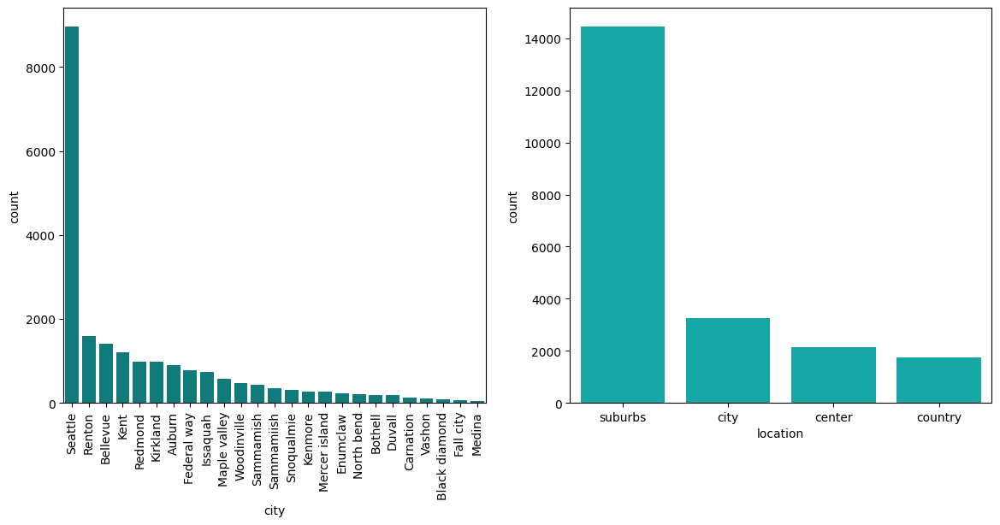

In [85]:
fig, ax = plt.subplots(1,2, figsize=(14,6))

sns.countplot(x=df["city"], order = df['city'].value_counts().index, ax= ax[0], color="darkcyan")
sns.countplot(x=df["location"], order = df['location'].value_counts().index, ax= ax[1], color="c");

ax[0].tick_params(axis='x', labelrotation=90)

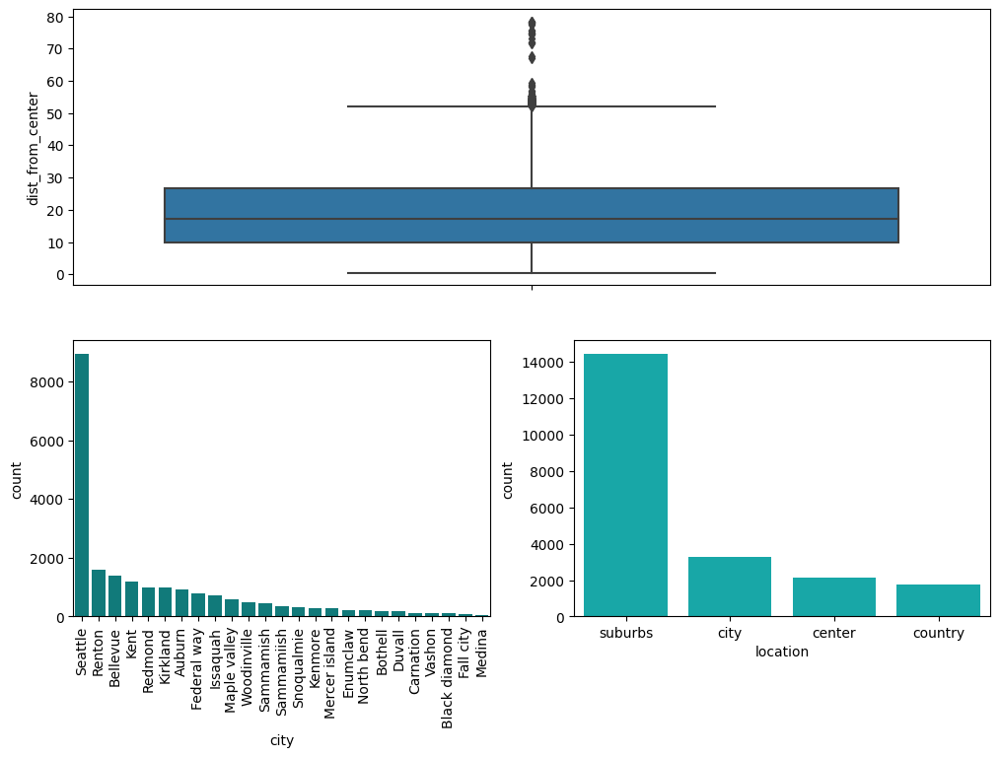

In [86]:
fig = plt.figure(figsize=(12,8))
plt.subplot(2,1,1)
sns.boxplot(data=df, y="dist_from_center")

plt.subplot(2,2,3)
sns.countplot(x=df["city"], order = df['city'].value_counts().index, color="darkcyan")
plt.tick_params(axis='x', labelrotation=90)

plt.subplot(2,2,4)
sns.countplot(x=df["location"], order = df['location'].value_counts().index, color="c");



#### Lot footage and living space

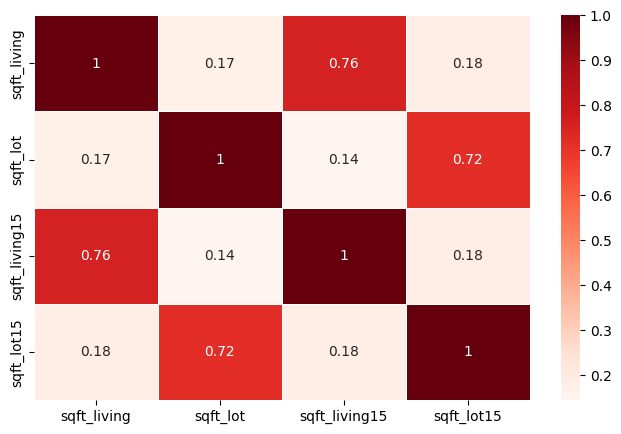

In [87]:
corr_sqfts = df[["sqft_living","sqft_lot","sqft_living15", "sqft_lot15"]].corr()
# draw the heatmap 
sns.heatmap(corr_sqfts, linewidths=.5, annot=True, cmap='Reds');

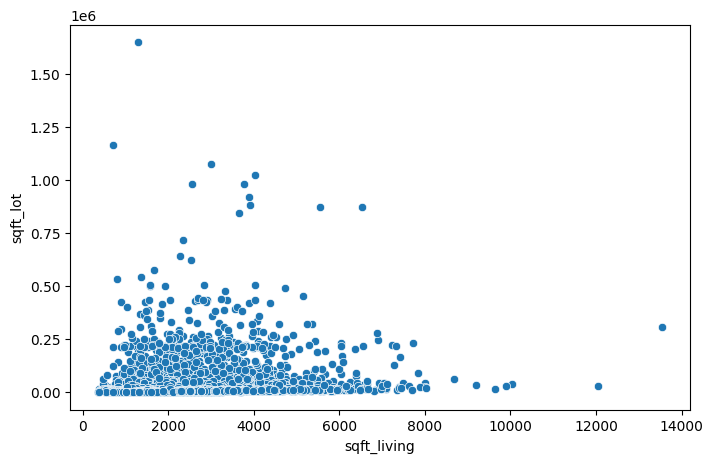

In [88]:
sns.scatterplot(data=df, x="sqft_living", y="sqft_lot");

As the square meter of living space and the lot correlate with the square meter of living space and the lot of the neighbors, we don't care about the neighbors and drop the columns.

In [89]:
df = df.drop(["sqft_living15", "sqft_lot15"],axis=1)

Now we explore the square meter of living space and the lot and create categories.

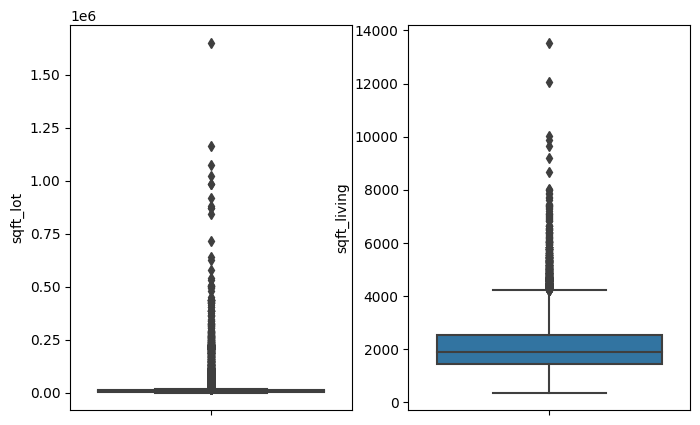

In [90]:
fig, ax = plt.subplots(1,2)
sns.boxplot(data=df, y="sqft_lot", ax= ax[0])
sns.boxplot(data=df, y="sqft_living", ax= ax[1]);

Text(0.5, 0.98, 'Distribution of lot and living space')

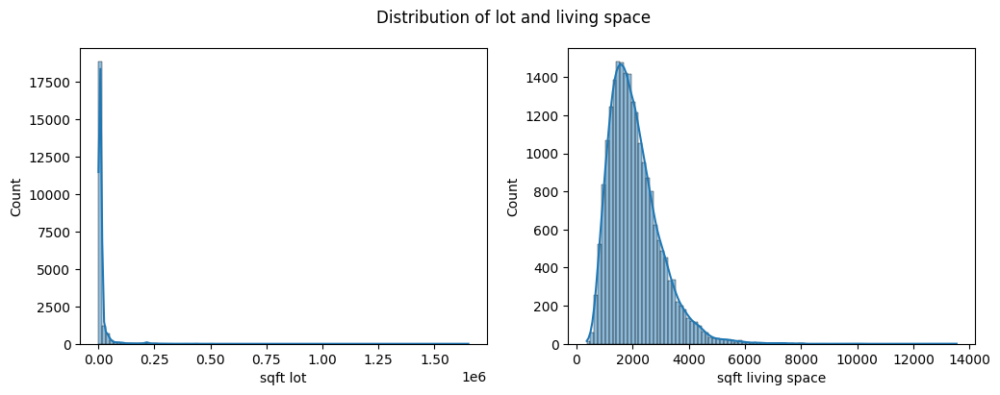

In [91]:
# Initialize the matplotlib figure
fig, ax = plt.subplots(1,2, figsize=(12,4))

sns.histplot(df[["sqft_lot"]], bins = 100, ax= ax[0], kde=True, legend=False, color="darkcyan")
sns.histplot(df[["sqft_living"]], bins = 100, ax= ax[1], kde=True, legend=False, color="cadetblue");

ax[0].set(xlabel = "sqft lot")
ax[1].set(xlabel = "sqft living space")

fig.suptitle('Distribution of lot and living space')


In [92]:
df[["sqft_lot","sqft_living"]].describe()

,sqft_lot,sqft_living
count,21579.000,21579.000
mean,15105.825,2079.951
std,41428.538,917.797
min,520.000,370.000
25%,5042.500,1430.000
50%,7620.000,1910.000
75%,10688.500,2550.000
max,1651359.000,13540.000


sqft of lot has some big outliers. 

Try to make bins - for dealing with outliers.

In [93]:
# Define the bins with the taking into account 4 quartiles but the same sized
# Use the cut() method to create the bins and map every row to one of them.
bins_1 = [0 , 4000, 8000, 12000, df["sqft_lot"].max()]
lot_bins = pd.cut(df["sqft_lot"], bins_1, labels=["small_lot", "medium_sized_lot", "big_lot", "very_big_lot"], retbins=True)

In [94]:
lot_bins

(0        medium_sized_lot
 1        medium_sized_lot
 2                 big_lot
 3        medium_sized_lot
 4                 big_lot
                ...       
 21574           small_lot
 21575    medium_sized_lot
 21576           small_lot
 21577           small_lot
 21578           small_lot
 Name: sqft_lot, Length: 21579, dtype: category
 Categories (4, object): ['small_lot' < 'medium_sized_lot' < 'big_lot' < 'very_big_lot'],
 array([      0,    4000,    8000,   12000, 1651359]))

In [95]:
lot_bins[0].value_counts()

sqft_lot
medium_sized_lot    8517
big_lot             5416
very_big_lot        4429
small_lot           3217
Name: count, dtype: int64

In [96]:
df["lot_category"] = lot_bins[0]

In [97]:
df[["sqft_lot","sqft_living"]].describe()

,sqft_lot,sqft_living
count,21579.000,21579.000
mean,15105.825,2079.951
std,41428.538,917.797
min,520.000,370.000
25%,5042.500,1430.000
50%,7620.000,1910.000
75%,10688.500,2550.000
max,1651359.000,13540.000


In [98]:
# Define the bins with the taking into account 4 quartiles but the same sized
# Use the cut() method to create the bins and map every row to one of them.
bins_2 = [0 , 1000, 2000, 3000, df["sqft_living"].max()]
space_bins = pd.cut(df["sqft_living"], bins_2, labels=["small_space", "medium_sized_space", "big_space", "very_big_space"], retbins=True)

In [99]:
space_bins

(0        medium_sized_space
 1                 big_space
 2               small_space
 3        medium_sized_space
 4        medium_sized_space
                 ...        
 21574    medium_sized_space
 21575             big_space
 21576    medium_sized_space
 21577    medium_sized_space
 21578    medium_sized_space
 Name: sqft_living, Length: 21579, dtype: category
 Categories (4, object): ['small_space' < 'medium_sized_space' < 'big_space' < 'very_big_space'],
 array([    0,  1000,  2000,  3000, 13540]))

In [100]:
space_bins[0].value_counts()

sqft_living
medium_sized_space    10207
big_space              6812
very_big_space         3074
small_space            1486
Name: count, dtype: int64

In [101]:
df["space_category"] = space_bins[0]

In [102]:
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,condition,grade,yr_built,...,weekday_of_sale,season_of_sale,is_renovated,years_between_sale_renovation_building,city,dist_from_center,price_per_sqrt,location,lot_category,space_category
0,7129300520,2014-10-13,221900.000,3,1.000,1180,5650,3,7,1955,...,0,autumn,False,59,Seattle,14.278,188.051,suburbs,medium_sized_lot,medium_sized_space
1,6414100192,2014-12-09,538000.000,3,2.250,2570,7242,3,7,1951,...,1,winter,True,23,Seattle,11.234,209.339,suburbs,medium_sized_lot,big_space
2,5631500400,2015-02-25,180000.000,2,1.000,770,10000,3,6,1933,...,2,winter,False,82,Kenmore,15.627,233.766,suburbs,big_lot,small_space
3,2487200875,2014-12-09,604000.000,4,3.000,1960,5000,5,7,1965,...,1,winter,False,49,Seattle,11.713,308.163,suburbs,medium_sized_lot,medium_sized_space
4,1954400510,2015-02-18,510000.000,3,2.000,1680,8080,3,8,1987,...,2,winter,False,28,Sammamish,23.021,303.571,suburbs,big_lot,medium_sized_space
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21574,263000018,2014-05-21,360000.000,3,2.500,1530,1131,3,8,2009,...,2,spring,False,5,Seattle,8.557,235.294,city,small_lot,medium_sized_space
21575,6600060120,2015-02-23,400000.000,4,2.500,2310,5813,3,8,2014,...,0,winter,False,1,Seattle,12.449,173.160,suburbs,medium_sized_lot,big_space
21576,1523300141,2014-06-23,402101.000,2,0.750,1020,1350,3,7,2009,...,0,summer,False,5,Seattle,5.053,394.217,center,small_lot,medium_sized_space
21577,291310100,2015-01-16,400000.000,3,2.500,1600,2388,3,8,2004,...,4,winter,False,11,Issaquah,23.375,250.000,suburbs,small_lot,medium_sized_space


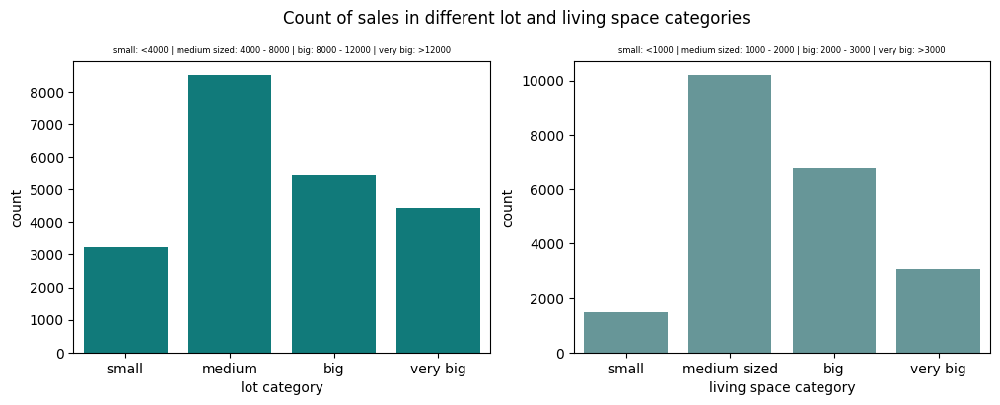

In [103]:
fig, ax = plt.subplots(1,2, figsize=(12,4))

sns.countplot(x=df["lot_category"], ax= ax[0], color="darkcyan")
sns.countplot(x=df["space_category"], ax= ax[1], color="cadetblue");

ax[0].set(xlabel = "lot category")
ax[1].set(xlabel = "living space category")

ax[0].set_xticklabels(["small", "medium", "big", "very big"])
ax[1].set_xticklabels(["small", "medium sized", "big", "very big"])

ax[0].set_title("small: <4000 | medium sized: 4000 - 8000 | big: 8000 - 12000 | very big: >12000", fontdict={'size': 6})
ax[1].set_title("small: <1000 | medium sized: 1000 - 2000 | big: 2000 - 3000 | very big: >3000", fontdict={'size': 6})

fig.suptitle('Count of sales in different lot and living space categories')
plt.subplots_adjust(top=0.85)


#### Price range

Now we want to explore how the prices are distributed.

<Axes: ylabel='Count'>

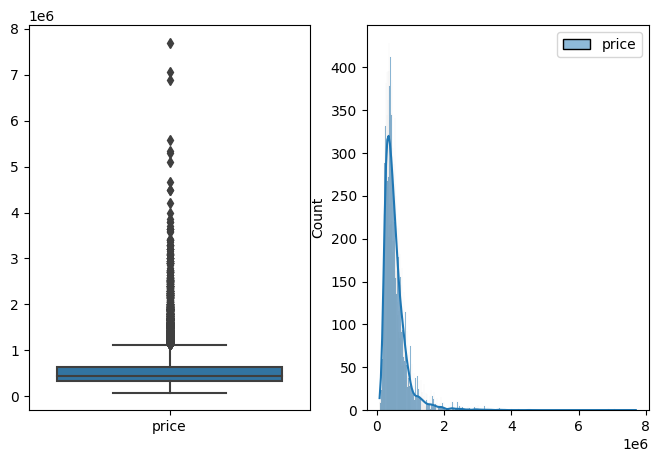

In [104]:
fig, ax = plt.subplots(1,2)

sns.boxplot(df[["price"]], ax= ax[0])
sns.histplot(df[["price"]], bins = 1000, ax= ax[1], kde=True)


In [105]:
df[["price"]].describe()

,price
count,21579.000
mean,540311.010
std,367487.332
min,78000.000
25%,322000.000
50%,450000.000
75%,645000.000
max,7700000.000


In [106]:
# Define the bins taking into account the 5 quantiles but the same sized
# Use the cut() method to create the bins and map every row to one of them.
bins_3 = [0 , 200000, 400000, 600000, 800000, df["price"].max()]
price_bins = pd.cut(df["price"], bins_3, labels=["very_low_price", "low_price", "middle_price", "high_price", "very_high_price"], retbins=True)

In [107]:
price_bins

(0             low_price
 1          middle_price
 2        very_low_price
 3            high_price
 4          middle_price
               ...      
 21574         low_price
 21575         low_price
 21576      middle_price
 21577         low_price
 21578         low_price
 Name: price, Length: 21579, dtype: category
 Categories (5, object): ['very_low_price' < 'low_price' < 'middle_price' < 'high_price' < 'very_high_price'],
 array([      0.,  200000.,  400000.,  600000.,  800000., 7700000.]))

In [108]:
df["price_category"] = price_bins[0]

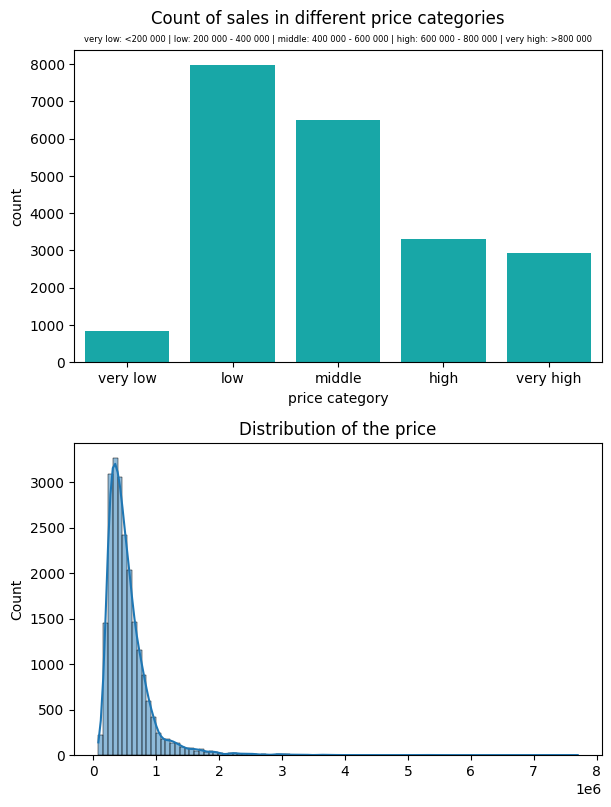

In [109]:
fig, ax = plt.subplots(2,1, figsize=(6,8))
# Set space between the subplots axis
fig.tight_layout(h_pad=4)

sns.histplot(df[["price"]], bins = 100, ax= ax[1], kde=True, color="darkcyan", legend=False)

sns.countplot(x=df["price_category"], color="c", ax=ax[0])

ax[0].set(xlabel = "price category")

ax[0].set_xticklabels(["very low", "low", "middle","high", "very high"])

ax[1].set_title("Distribution of the price")
ax[0].set_title("very low: <200 000 | low: 200 000 - 400 000 | middle: 400 000 - 600 000 | high: 600 000 - 800 000 | very high: >800 000", fontdict={'size': 6})

fig.suptitle("Count of sales in different price categories")
plt.subplots_adjust(top=0.93)


#### Renovated or not
Explore the distribution of the renovated category.

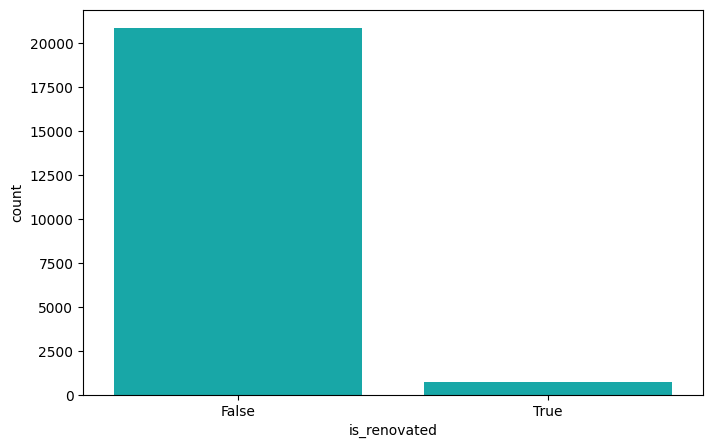

In [110]:
sns.countplot(data = df,x="is_renovated", color="c");

In [111]:
df[["years_between_sale_renovation_building"]].value_counts()

years_between_sale_renovation_building
0                                         498
9                                         491
8                                         477
11                                        457
10                                        457
                                         ... 
79                                         32
113                                        27
115                                        23
81                                         17
80                                         15
Name: count, Length: 116, dtype: int64

<Axes: xlabel='years_between_sale_renovation_building', ylabel='Count'>

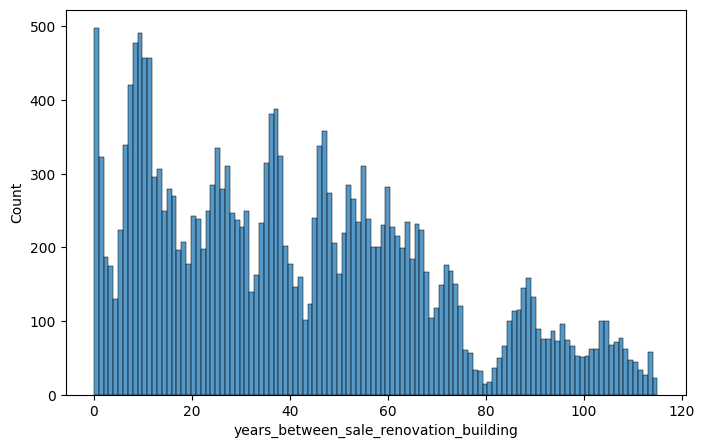

In [112]:
sns.histplot(data=df, x="years_between_sale_renovation_building", bins=116)

In [113]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'condition', 'grade', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'number_of_sales', 'year_of_sale', 'month_of_sale',
       'weekday_of_sale', 'season_of_sale', 'is_renovated',
       'years_between_sale_renovation_building', 'city', 'dist_from_center',
       'price_per_sqrt', 'location', 'lot_category', 'space_category',
       'price_category'],
      dtype='object')

#### Grade
Explore the distribution of the grade categories and which category is best condition.

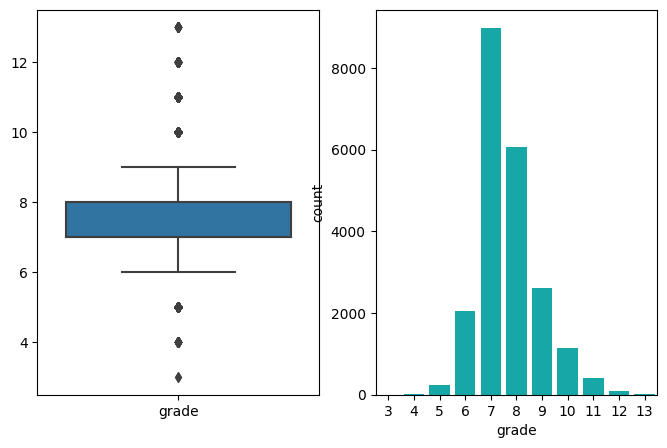

In [114]:
fig, ax = plt.subplots(1,2)

sns.boxplot(df[["grade"]], ax= ax[0])
sns.countplot(x=df["grade"], color="c", ax=ax[1]);

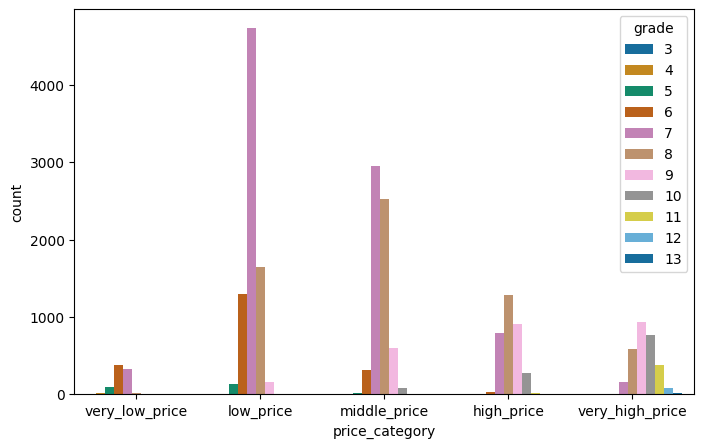

In [115]:
sns.countplot(data=df, x="price_category", hue="grade", palette="colorblind");

<Axes: xlabel='price_category', ylabel='grade'>

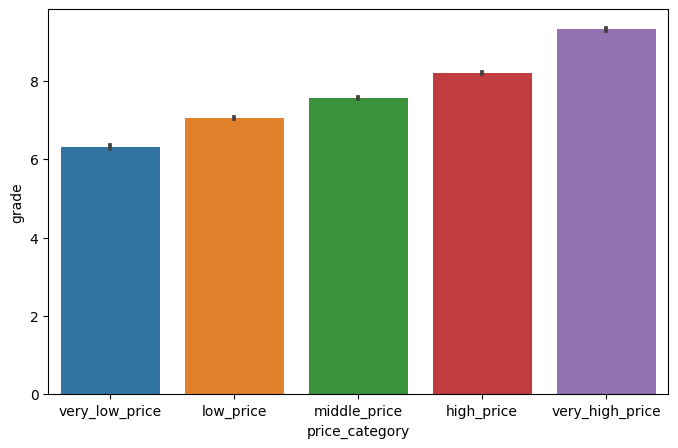

In [116]:
sns.barplot(data=df, x="price_category", y="grade")

Conclusion: The higher the grade, the better is quality of the house.

In [117]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'condition', 'grade', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'number_of_sales', 'year_of_sale', 'month_of_sale',
       'weekday_of_sale', 'season_of_sale', 'is_renovated',
       'years_between_sale_renovation_building', 'city', 'dist_from_center',
       'price_per_sqrt', 'location', 'lot_category', 'space_category',
       'price_category'],
      dtype='object')

#### Condition
Explore the distribution of the condition categories and which category is best condition.

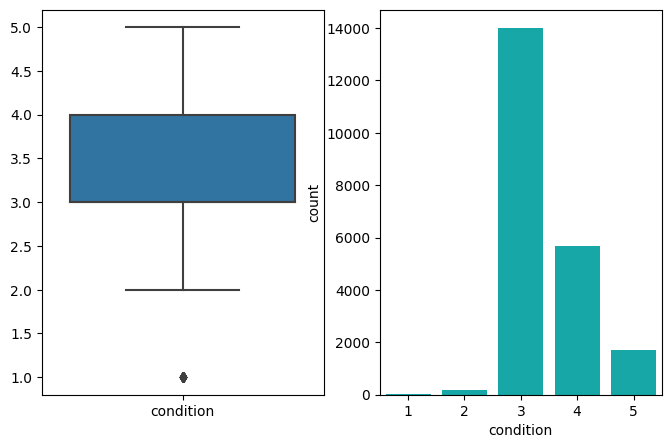

In [118]:
fig, ax = plt.subplots(1,2)

sns.boxplot(df[["condition"]], ax= ax[0])
sns.countplot(x=df["condition"], color="c");


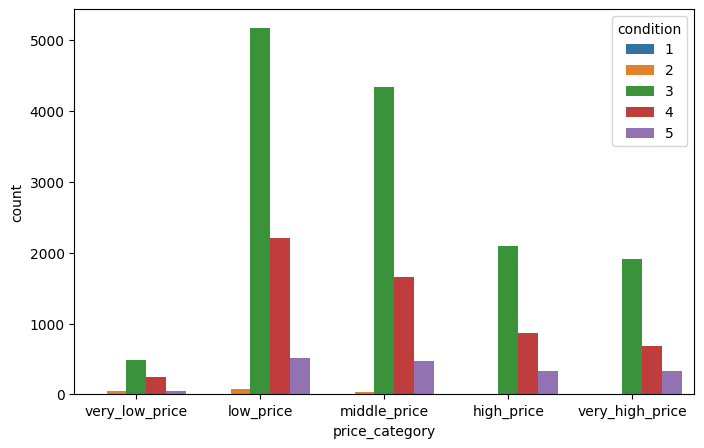

In [119]:
sns.countplot(data=df, x="price_category", hue="condition");

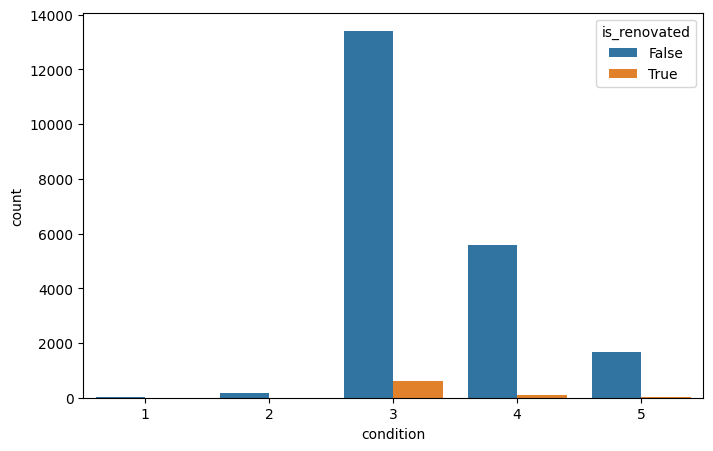

In [120]:
sns.countplot(data=df, x="condition", hue="is_renovated");

Conclusion: The higher the condition rank, the better is the condition of the house.

Text(0.5, 1.0, 'Count of sales for different grade')

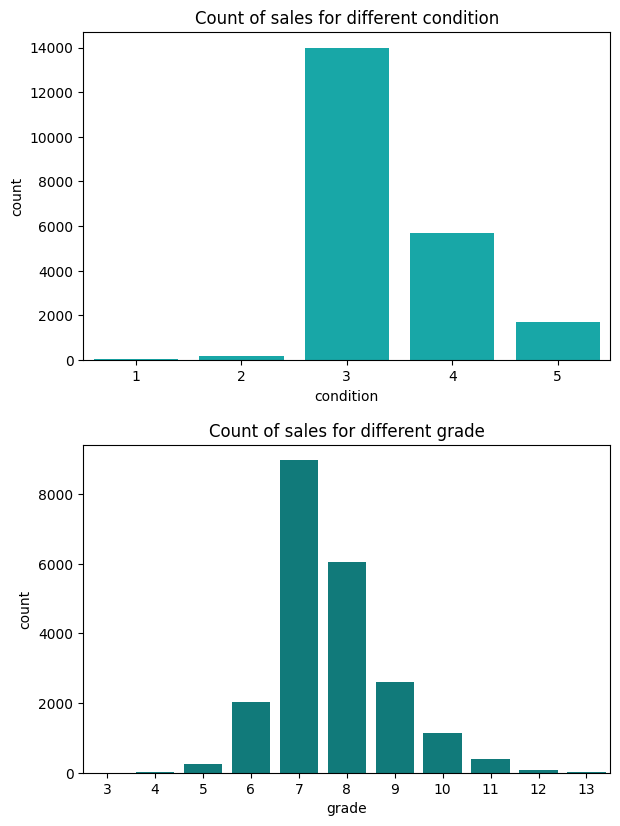

In [121]:
fig, ax = plt.subplots(2,1, figsize=(6,8))
# Set space between the subplots axis
fig.tight_layout(h_pad=4)

sns.countplot(x=df["condition"], color="c", ax=ax[0])

sns.countplot(x=df["grade"], color="darkcyan", ax=ax[1]);

ax[0].set(xlabel = "condition")
ax[1].set(xlabel = "grade")

ax[0].set_title("Count of sales for different condition")
ax[1].set_title("Count of sales for different grade")

# fig.suptitle("Count of sales for different condition and grade ranking")
# plt.subplots_adjust(top=0.92)


#### Bathrooms and bedrooms

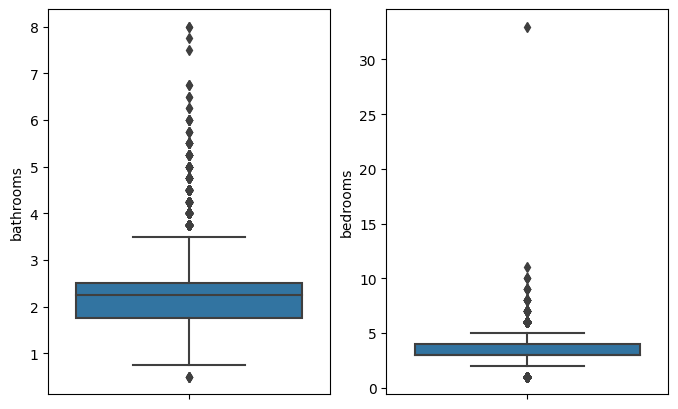

In [122]:
fig, ax = plt.subplots(1,2)
sns.boxplot(data=df, y="bathrooms", ax= ax[0])
sns.boxplot(data=df, y="bedrooms", ax= ax[1]);

In [123]:
df[["bathrooms","bedrooms"]].describe()

,bathrooms,bedrooms
count,21579.000,21579.000
mean,2.115,3.373
std,0.769,0.926
min,0.500,1.000
25%,1.750,3.000
50%,2.250,3.000
75%,2.500,4.000
max,8.000,33.000


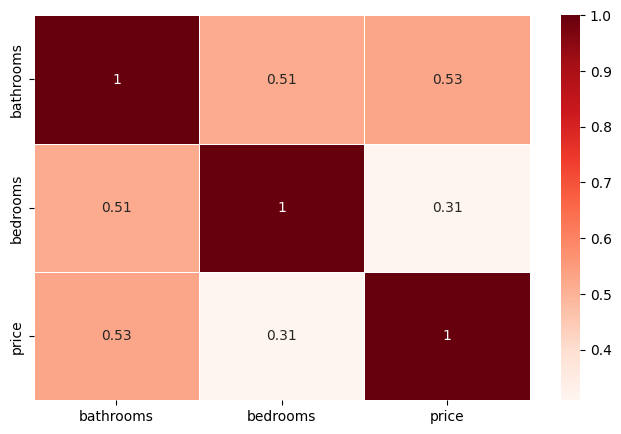

In [124]:
corr_bath_bed = df[["bathrooms","bedrooms","price"]].corr()
# draw the heatmap 
sns.heatmap(corr_bath_bed, linewidths=.5, annot=True, cmap='Reds');

#### Distribution of house sales over time

In [125]:
df.year_of_sale.value_counts()

year_of_sale
2014    14604
2015     6975
Name: count, dtype: int64

In [126]:
df.date.describe()

count                            21579
mean     2014-10-29 05:55:28.736271360
min                2014-05-02 00:00:00
25%                2014-07-22 00:00:00
50%                2014-10-16 00:00:00
75%                2015-02-17 00:00:00
max                2015-05-27 00:00:00
Name: date, dtype: object

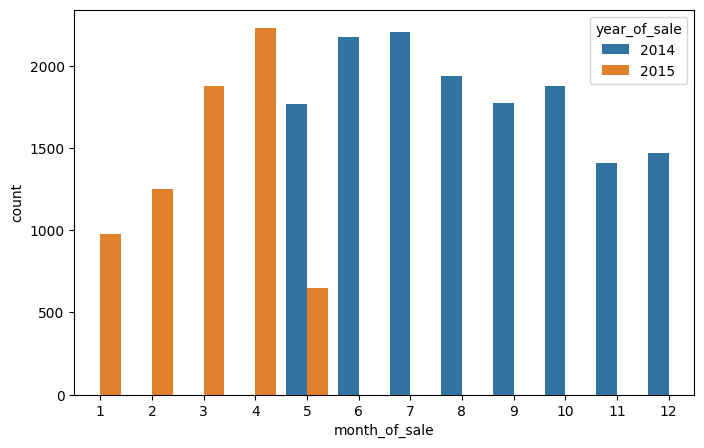

In [127]:
sns.countplot(data=df, x="month_of_sale", hue="year_of_sale");

In [128]:
pd.pivot_table(data=df, index="year_of_sale", columns="month_of_sale", values="id", aggfunc="count")

month_of_sale,1,2,3,4,5,6,7,8,9,10,11,12
year_of_sale,,,,,,,,,,,,
2014,NaN,NaN,NaN,NaN,1766.000,2174.000,2207.000,1936.000,1771.000,1873.000,1408.000,1469.000
2015,978.000,1247.000,1875.000,2229.000,646.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


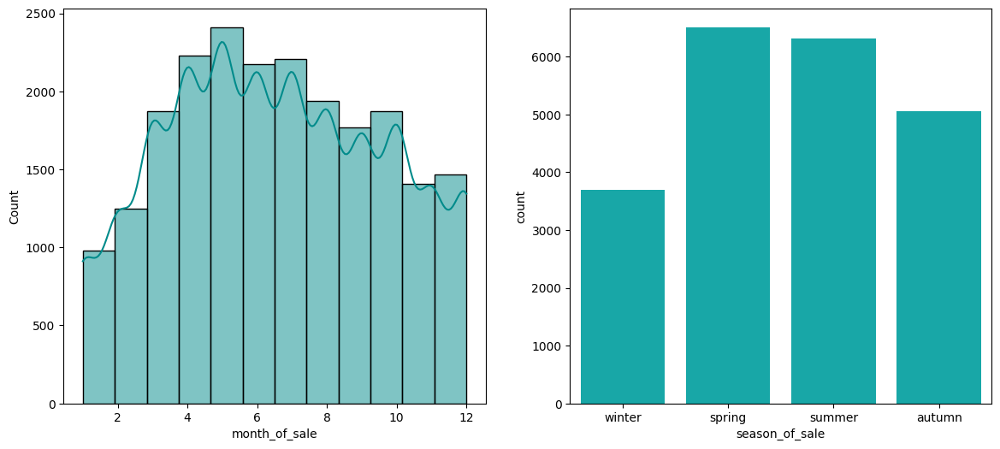

In [129]:
fig, ax = plt.subplots(1,2, figsize=(14,6))  

#sns.countplot(data=df, x="month_of_sale", ax= ax[0], color="darkcyan")
sns.histplot(data=df, x="month_of_sale", ax= ax[0], kde=True, color="darkcyan", bins=12)
sns.countplot(data=df, x="season_of_sale", order=["winter", "spring", "summer", "autumn"], ax= ax[1], color="c");

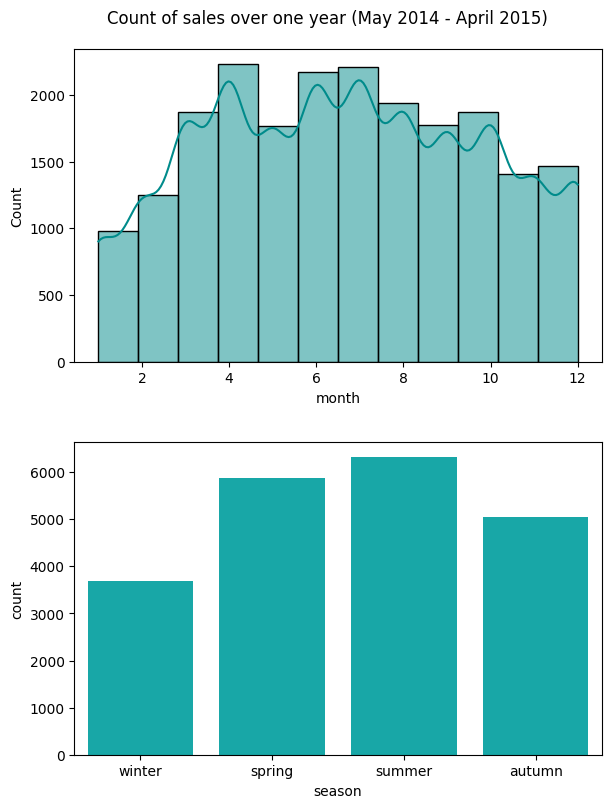

In [130]:
# we see the most sales are in may. but for that month we have data from 2014 and 2015. Let's just look at 12 months.
fig, ax = plt.subplots(2,1, figsize=(6,8))  
fig.tight_layout(h_pad=4)

#sns.countplot(data=df, x="month_of_sale", ax= ax[0], color="darkcyan")
sns.histplot(data=df.query("date < '2015-05-01'"), x="month_of_sale", ax= ax[0], kde=True, color="darkcyan", bins=12)
sns.countplot(data=df.query("date < '2015-05-01'"), x="season_of_sale", order=["winter", "spring", "summer", "autumn"], ax= ax[1], color="c");

ax[0].set(xlabel = "month")
ax[1].set(xlabel = "season")

fig.suptitle("Count of sales over one year (May 2014 - April 2015)")
plt.subplots_adjust(top=0.93)

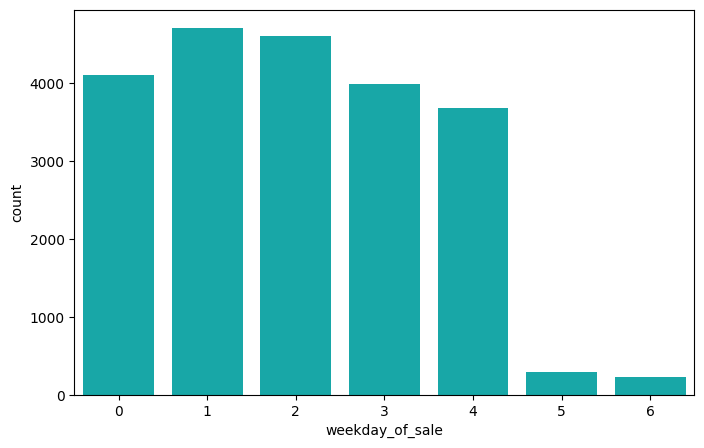

In [131]:
sns.countplot(data=df, x="weekday_of_sale", color="c");

#### Data overview 


In [132]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,condition,grade,yr_built,...,season_of_sale,is_renovated,years_between_sale_renovation_building,city,dist_from_center,price_per_sqrt,location,lot_category,space_category,price_category
0,7129300520,2014-10-13,221900.000,3,1.000,1180,5650,3,7,1955,...,autumn,False,59,Seattle,14.278,188.051,suburbs,medium_sized_lot,medium_sized_space,low_price
1,6414100192,2014-12-09,538000.000,3,2.250,2570,7242,3,7,1951,...,winter,True,23,Seattle,11.234,209.339,suburbs,medium_sized_lot,big_space,middle_price
2,5631500400,2015-02-25,180000.000,2,1.000,770,10000,3,6,1933,...,winter,False,82,Kenmore,15.627,233.766,suburbs,big_lot,small_space,very_low_price
3,2487200875,2014-12-09,604000.000,4,3.000,1960,5000,5,7,1965,...,winter,False,49,Seattle,11.713,308.163,suburbs,medium_sized_lot,medium_sized_space,high_price
4,1954400510,2015-02-18,510000.000,3,2.000,1680,8080,3,8,1987,...,winter,False,28,Sammamish,23.021,303.571,suburbs,big_lot,medium_sized_space,middle_price


In [133]:
df.shape

(21579, 28)

In [134]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'condition', 'grade', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'number_of_sales', 'year_of_sale', 'month_of_sale',
       'weekday_of_sale', 'season_of_sale', 'is_renovated',
       'years_between_sale_renovation_building', 'city', 'dist_from_center',
       'price_per_sqrt', 'location', 'lot_category', 'space_category',
       'price_category'],
      dtype='object')

## Explore the price behavior more deeply

In terms of our research questions.

### Price and location / distance from city center

Question: Are houses in the country, the suburbs, the city or the center more expansive?

**Hypothesis**  

Country house:
- The closer a house in the country is to a city, the higher the price.

 City house:   
- The closer a house is located to the city center, the higher the price.



<Axes: xlabel='price', ylabel='Count'>

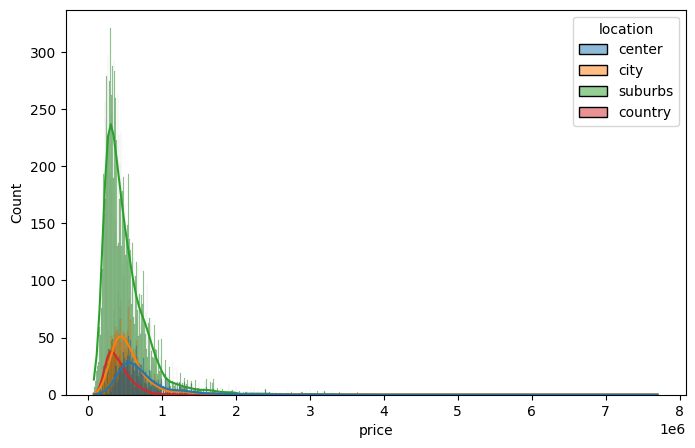

In [135]:
sns.histplot(data=df, x="price", bins = 1000, hue="location", kde=True)

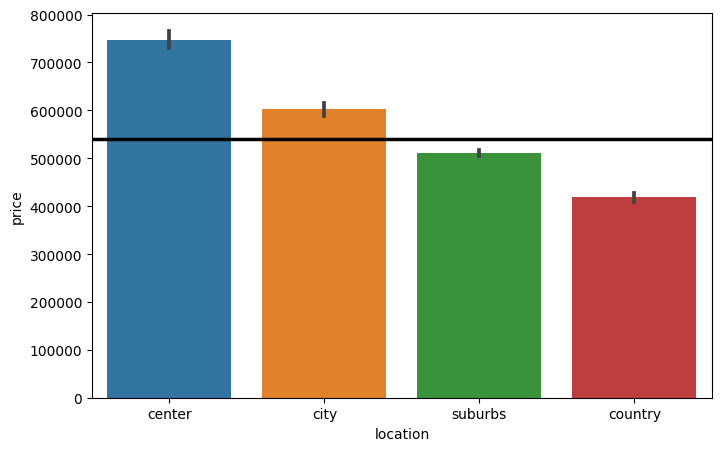

In [136]:
# mean price for each location
mean = df.price.mean()
sns.barplot(data=df, x="location", y="price")
plt.axhline(mean, c='k', ls='-', lw=2.5);

<Axes: xlabel='location', ylabel='price_per_sqrt'>

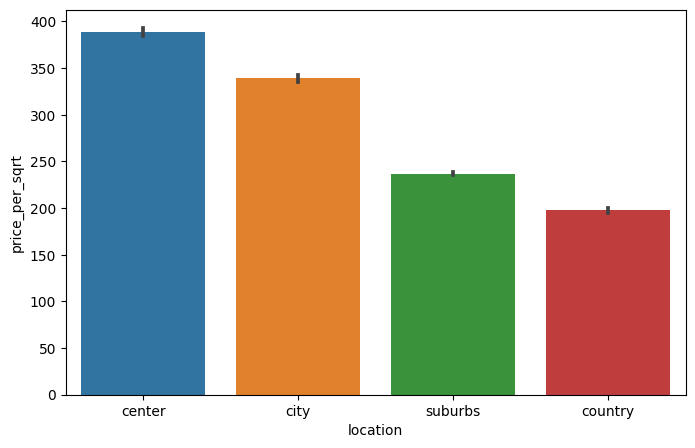

In [137]:
# mean price per square meter for each location
sns.barplot(data=df, x="location", y="price_per_sqrt")

Text(0.5, 0.98, 'Price and distance from city center')

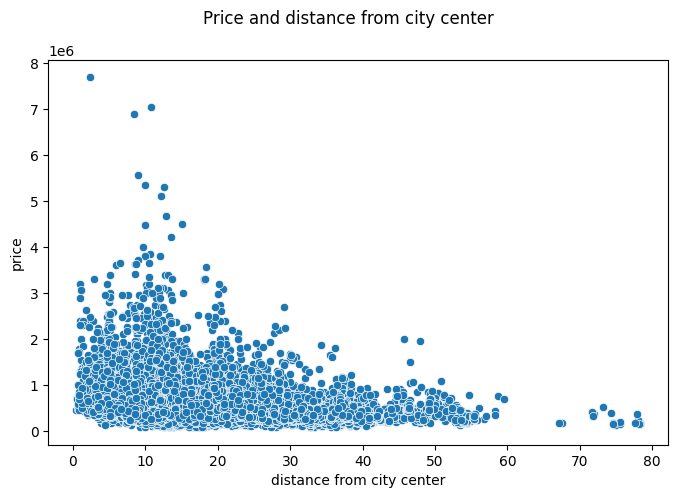

In [138]:
fig, ax = plt.subplots()

sns.scatterplot(data=df, x="dist_from_center", y="price",ax = ax);

ax.set(xlabel = "distance from city center")

fig.suptitle('Price and distance from city center')

<Axes: xlabel='dist_from_center', ylabel='price_per_sqrt'>

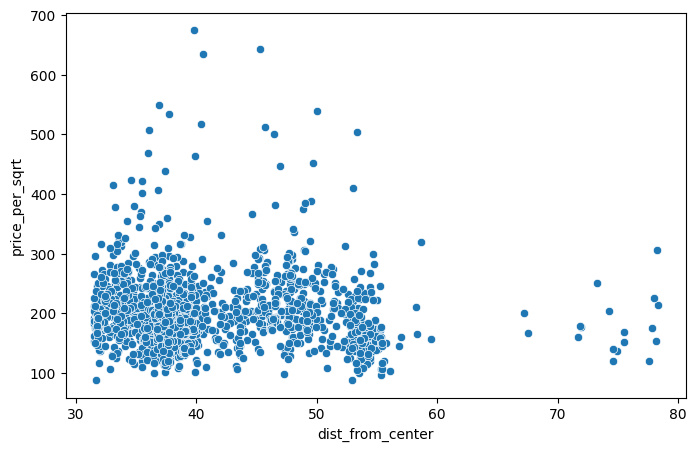

In [139]:
# country
sns.scatterplot(data=df.query("location == 'country'"), x="dist_from_center", y="price_per_sqrt")

<Axes: xlabel='dist_from_center', ylabel='price'>

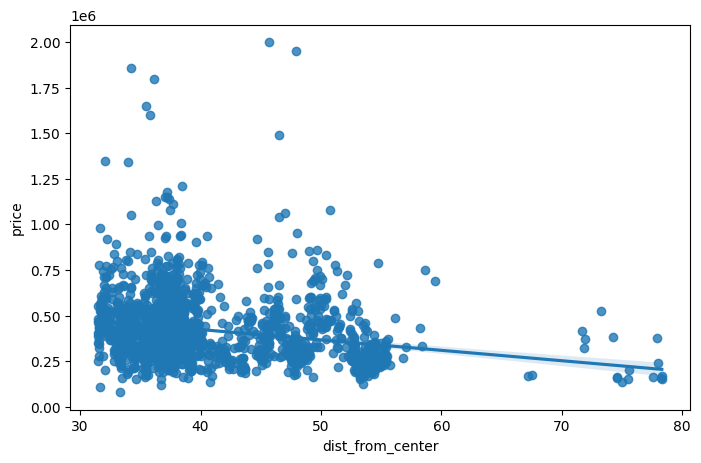

In [140]:
sns.regplot(x = "dist_from_center", y = "price", data=df.query("location == 'country'"))

<Axes: xlabel='dist_from_center', ylabel='price'>

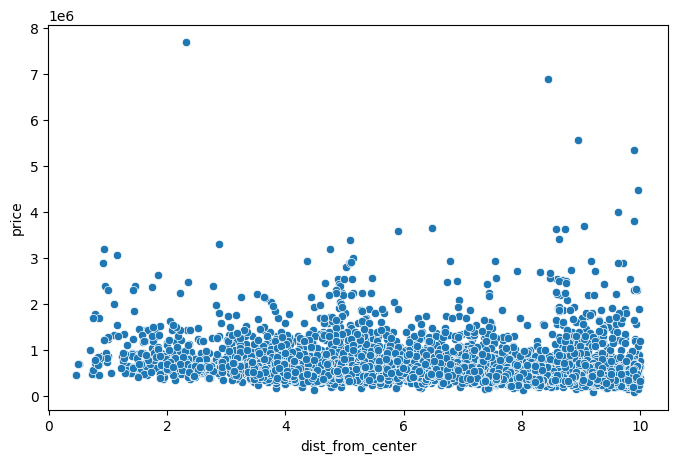

In [141]:
# city and center
sns.scatterplot(data=df.query("location in ['center','city']"), x="dist_from_center", y="price")

In [142]:
center = (47.567133211325505, -121.88943418816879)
data = df
loc_colors = data.location
#legend_order = {"location": ["center", "city", "suburbs", "country"]}
# fig = px.scatter_mapbox(data, 
#                         lat="lat", 
#                         lon="long", 
#                         hover_name="city", 
#                         hover_data=["location", "dist_from_center"],
#                         category_orders=legend_order,
#                         #color_discrete_sequence=["red"],
#                         opacity=0.5,
#                         zoom=8, 
#                         center = {"lat": center[0], "lon": center[1]},
#                         width=800, 
#                         height=600,
#                         color= loc_colors
#                         )
fig = px.density_mapbox(data, lat='lat', lon='long', z='price', radius=1,
                        zoom=8, center={"lat": center[0], "lon": center[1]},
                        )

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [143]:
center = (47.567133211325505, -121.88943418816879)
data = df.sample(20000)
loc_colors = data.price
legend_order = {"price_category": ['very_low_price','low_price','middle_price','high_price','very_high_price']}
fig = px.scatter_mapbox(data, 
                        lat="lat", 
                        lon="long", 
                        hover_name="city", 
                        hover_data=["location", "zipcode"],
                        category_orders=legend_order,
                        #color_discrete_sequence=["red"],
                        opacity=0.5,
                        zoom=8, 
                        center = {"lat": center[0], "lon": center[1]},
                        width=800, 
                        height=600,
                        color= loc_colors
                        )
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":5,"t":5,"l":5,"b":5})
fig.show()

In [144]:
center = (47.567133211325505, -121.88943418816879)
data = df.sample(20000)
loc_colors = data.price_category
legend_order = {"price_category": ['very_low_price','low_price','middle_price','high_price','very_high_price']}
legend = ['very low price','low price','middle price','high price','very high price']
fig = px.scatter_mapbox(data, 
                        lat="lat", 
                        lon="long", 
                        hover_name="city", 
                        hover_data=["location", "zipcode"],
                        category_orders=legend_order,
                        #color_discrete_sequence=["red"],
                        opacity=0.5,
                        zoom=8, 
                        center = {"lat": center[0], "lon": center[1]},
                        width=800, 
                        height=600,
                        color= loc_colors
                        )

fig.data[0].name = 'very low price'
fig.data[1].name = 'low price'
fig.data[2].name = 'middle price'
fig.data[3].name = 'high price'
fig.data[4].name = 'very high price'

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":5,"t":5,"l":5,"b":5})
fig.show()

In [145]:
df.price_category.value_counts().index.to_list()

['low_price',
 'middle_price',
 'high_price',
 'very_high_price',
 'very_low_price']

Conclusion: Houses in the center are in average more expansive than houses in the suburbs and country.  
But looking at the scatterplots and correlation, there isn't a directly linear correlation between the distance and the price.  
Looking at the heatmap we see the high prices in the center. But there are some other accumulation of sales with high prices, maybe other small city centers.

### Price changing over time

Question: How are the prices changing over one year (seasons) for houses in the country, the city, the suburbs or the seaside?

**Hypothesis**


Country house:
- The prices for houses in the country are higher in the summer.
- The prices for houses in the country are decreasing in the last years.

 City house:   
- The prices for houses in the city are higher in the winter.

<Axes: xlabel='season_of_sale', ylabel='price'>

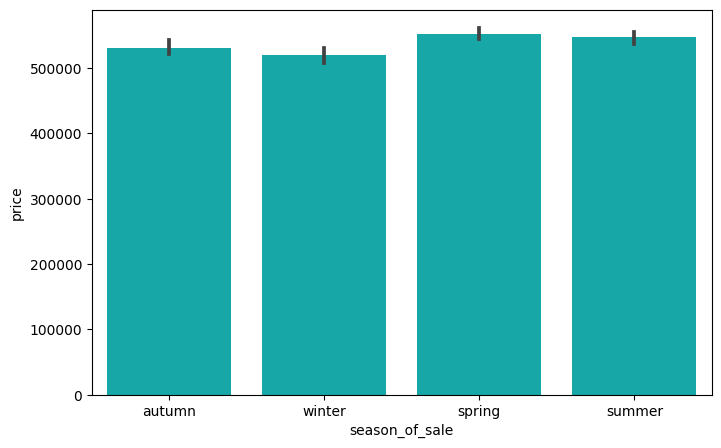

In [146]:
sns.barplot(data=df, x="season_of_sale", y="price", color="c")

<Axes: xlabel='month_of_sale', ylabel='price'>

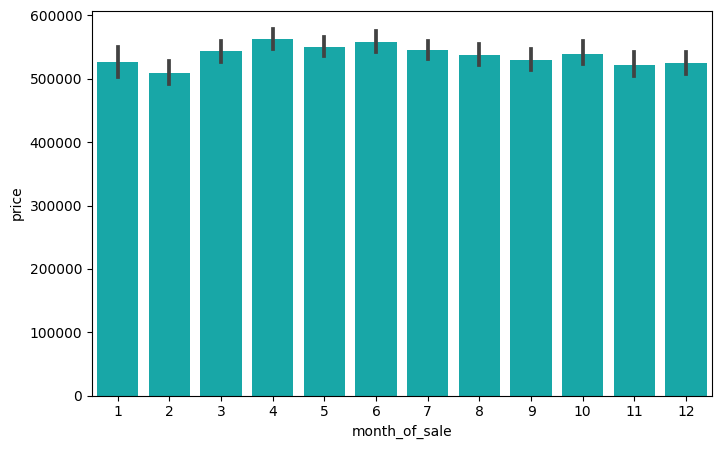

In [147]:
sns.barplot(data=df, x="month_of_sale", y="price", color="c")

<Axes: xlabel='season_of_sale', ylabel='price'>

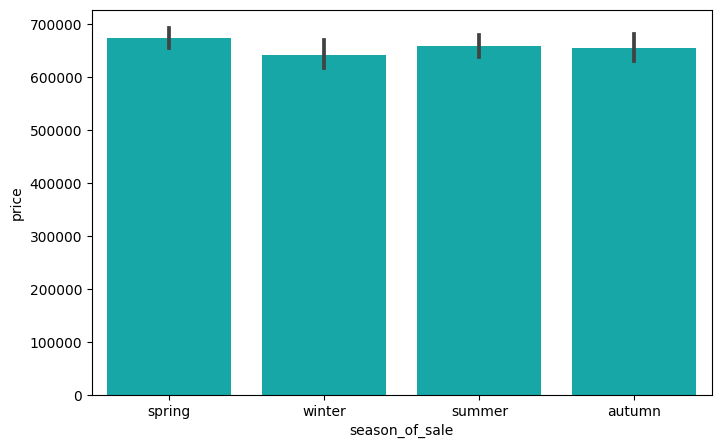

In [148]:
# center and city
sns.barplot(data=df.query("location in ['center','city']"), x="season_of_sale", y="price", color="c")

<Axes: xlabel='season_of_sale', ylabel='price'>

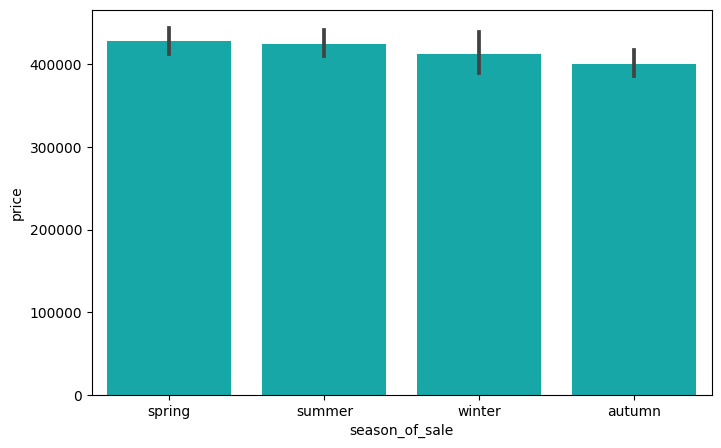

In [149]:
# country
sns.barplot(data=df.query("location in ['country']"), x="season_of_sale", y="price", color="c")

Conclusion: No significant differences in the mean price between the months or seasons. The prices are lightly higher in the summer and spring time.

In [150]:
price_per_date = df.groupby("date")[["price"]].mean().reset_index()

<Axes: xlabel='date', ylabel='price'>

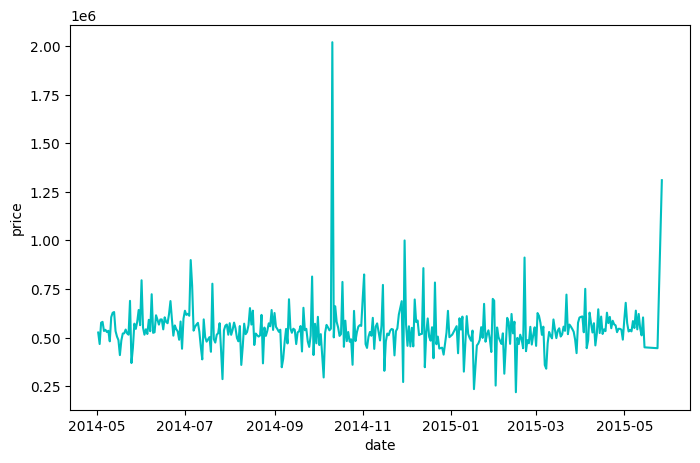

In [151]:
sns.lineplot(data=price_per_date, x="date", y="price", color="c")

### Renovated and not renovated houses

Questions:  
- Are recently renovated houses more expansive?
- Are recently built houses more expansive?

**Hypothesis**  

Country house:
- The more recent a house was built or renovated the higher the price.

 City house:   
not of interest

<Axes: xlabel='is_renovated', ylabel='price'>

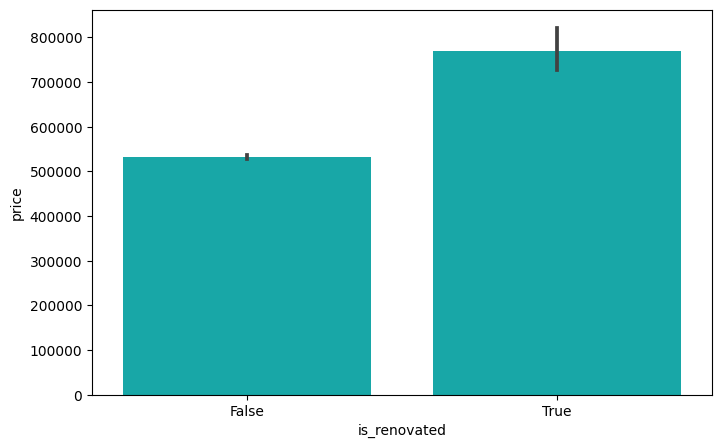

In [152]:
sns.barplot(data=df, x="is_renovated", y="price", color="c")

<Axes: xlabel='years_between_sale_renovation_building', ylabel='price_per_sqrt'>

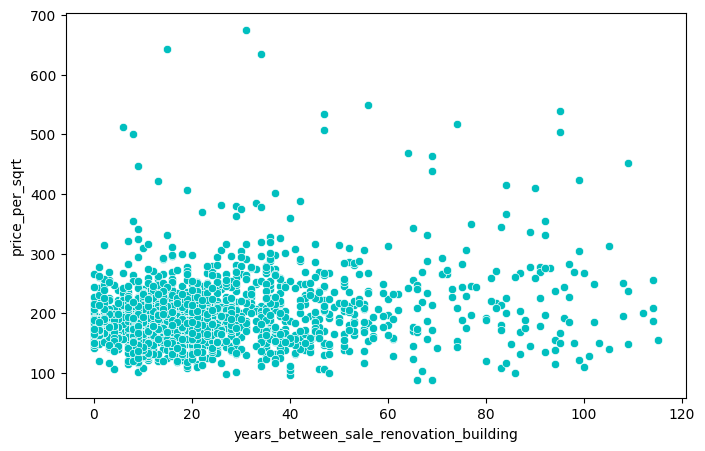

In [153]:
sns.scatterplot(data=df.query("location == 'country'"), x="years_between_sale_renovation_building", y="price_per_sqrt", color="c")

<Axes: xlabel='years_between_sale_renovation_building', ylabel='price_per_sqrt'>

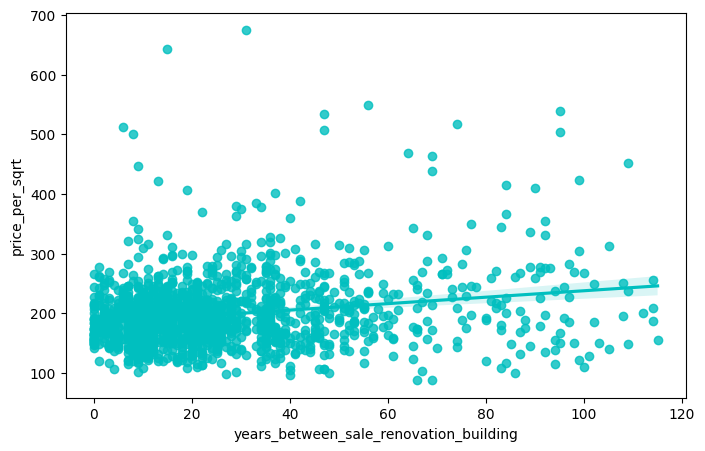

In [154]:
sns.regplot(x = "years_between_sale_renovation_building", y = "price_per_sqrt", data=df.query("location == 'country' and is_renovated == False"), color="c")

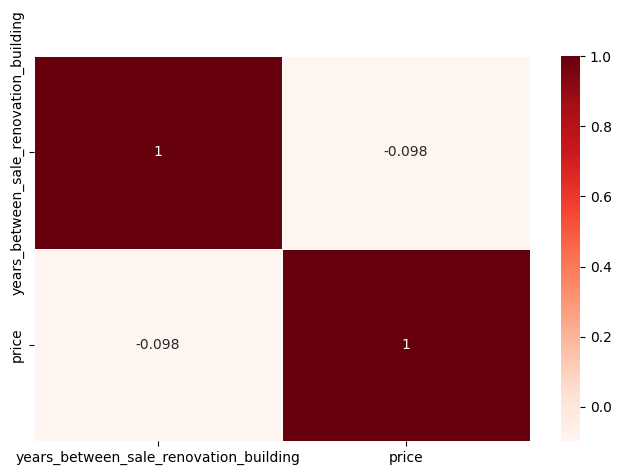

In [155]:
corr_bath_bed = df[["years_between_sale_renovation_building","price"]].corr()
# draw the heatmap 
sns.heatmap(corr_bath_bed, linewidths=.5, annot=True, cmap='Reds');

Conclusion: Renovated houses are in average more expansive than not-renovated houses.  
But looking at the scatterplots and correlation, there isn't a directly linear correlation between the years between renovation (or building) and the price.  

### Price and the grade

Question: Does the grade based on King County grading system affect the price?

**Hypothesis**
- The better the condition/grade of a (non-renovated) house is, the higher the price


<Axes: xlabel='grade', ylabel='price_per_sqrt'>

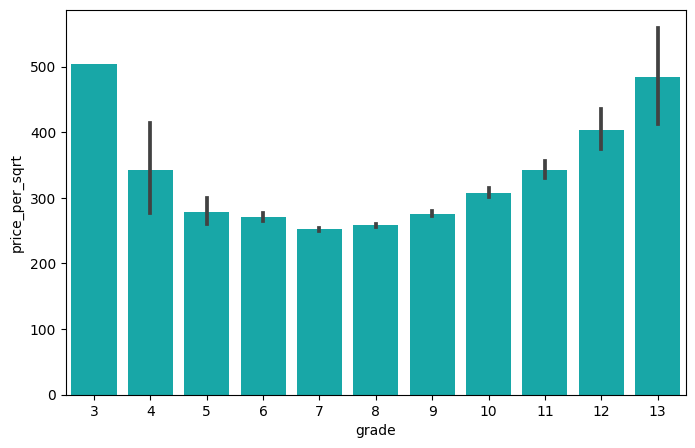

In [156]:
sns.barplot(data=df, x="grade", y="price_per_sqrt", color="c")

<Axes: xlabel='grade', ylabel='price'>

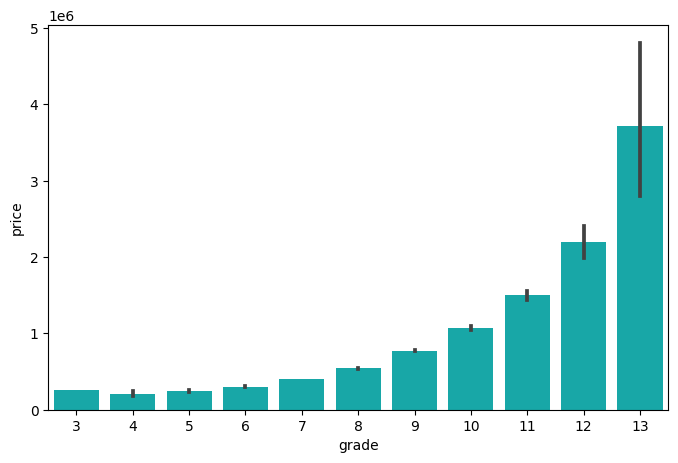

In [157]:
sns.barplot(data=df, x="grade", y="price", color="c")

<Axes: xlabel='grade', ylabel='price'>

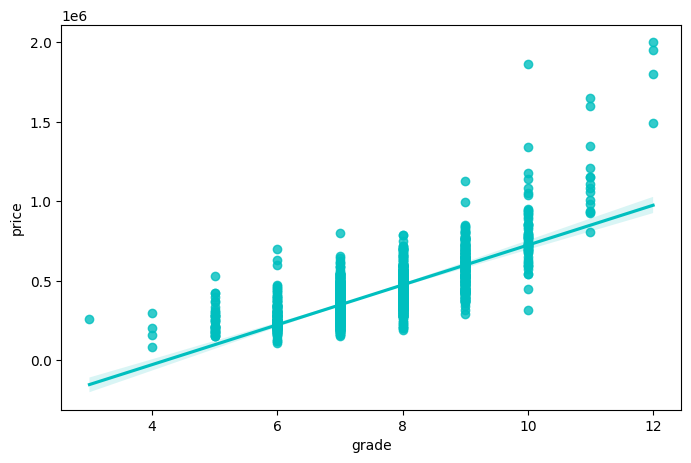

In [158]:
sns.regplot(x = "grade", y = "price", data=df.query("location == 'country' and is_renovated == False"), color="c")

<Axes: xlabel='price_category', ylabel='grade'>

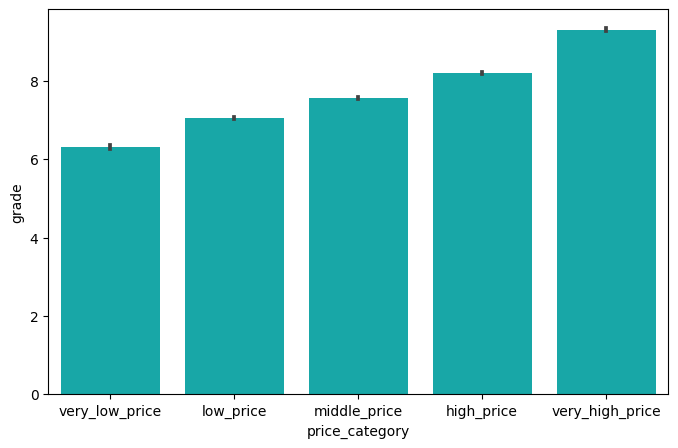

In [159]:
sns.barplot(data=df, y="grade", x="price_category", color="c")

Conclusion: The higher the grade the more expansive is the price in average.  
Also the mean grade in the higher price categories are higher. 

### Price and the number of bathrooms

Questions:  
Does the number of bathrooms increase the price?

**Hypothesis**  

The higher the number of bathrooms the higher the price.
 
Houses with a full bathroom are more expansive.

<Axes: xlabel='bathrooms', ylabel='price'>

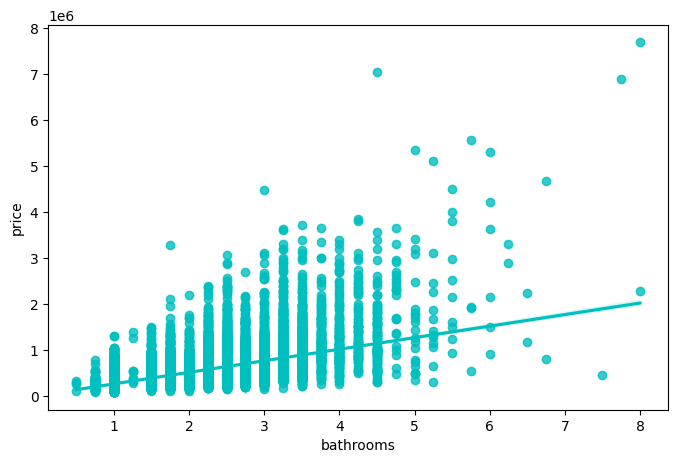

In [160]:
sns.regplot(x = "bathrooms", y = "price", data=df, color="c")

<Axes: xlabel='bathrooms', ylabel='price'>

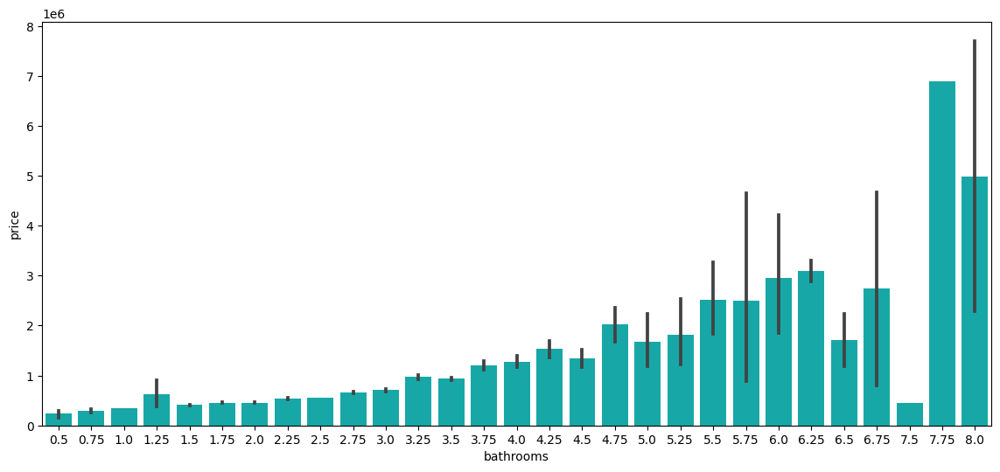

In [161]:
fig, ax = plt.subplots(figsize=(14,6))  
sns.barplot(data=df, x="bathrooms", y="price", color="c")

Conclusion: The higher the number of bathrooms the higher the price.

## Relationships
check for correlations between values are all correlations making sense?

In [162]:
df_corr = df[['price', 'price_per_sqrt', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'condition', 'grade', 'number_of_sales',
       'years_between_sale_renovation_building', 'dist_from_center']]

corr_mtrx = df_corr.corr(numeric_only=True)

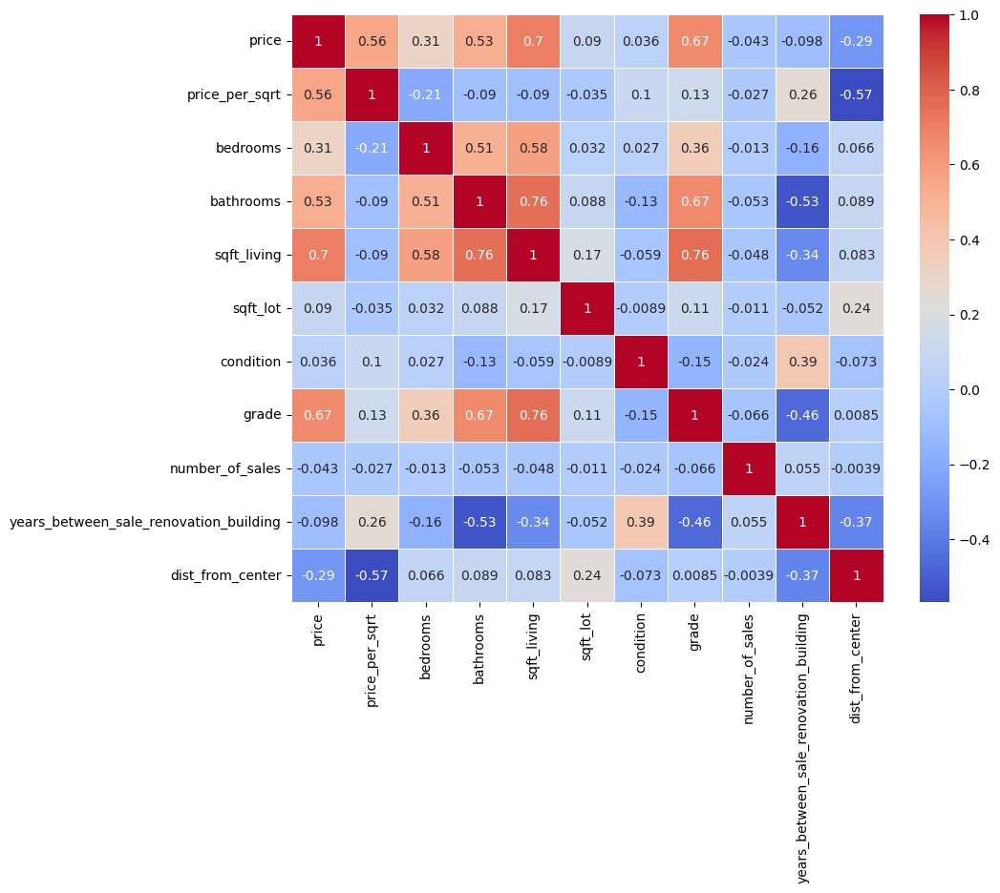

In [163]:
# draw the heatmap 
plt.figure(figsize = (10,8))
ax = sns.heatmap(corr_mtrx, linewidths=.5, annot=True, cmap='coolwarm')

Conclusion:  
We ses the price is high positively correlated to the sqft of the living space and the grade and also a bit with the number of bathrooms.  
On the other hand the grade and the number of bathrooms high negatively correlated to the years between building or renovation and the sale.

The other correlation we explored already in the chapter before.

## Back to the hypothesis
were your assumptions correct? did you tackle the right questions?

## Business case: Client William Rodriguez
Now we want to explore only the data part relevant for our client and the features that could affect his decision.  
**Assumption: number of sales is equal (strong linear correlated) to the number of houses on the market.**

Requirements (assumptions):
- interested in the city and country
-  want to buy the city house soon
- can wait for good time to buy country house
- city house should be near to the center
- country house should have some space outside
- middle - high house size
- middle - high price range
- good condition (at least 3) and high grade (at least 7)
- prefer two bathrooms, at least one full bathroom
- prefer 3 bedrooms, at least two bedrooms

### City house

First we filter our data with our conditions.

In [164]:
df_city_house = df.query("location in ['center','city','suburbs'] and space_category in ['small_space','medium_sized_space','big_space'] and price_category in ['middle_price','high_price', 'very_high_price'] and condition >= 3 and grade >= 7 and bathrooms >= 1 and bedrooms >= 2")

#### Location and price category

Text(0.5, 0.98, 'Price and distance from city center')

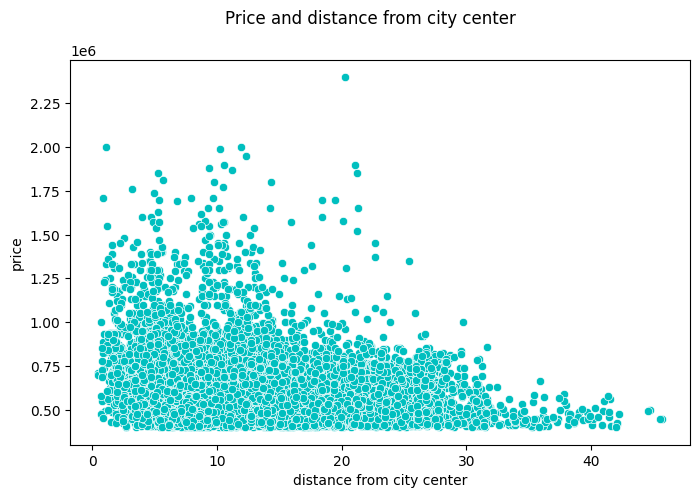

In [165]:
fig, ax = plt.subplots()

sns.scatterplot(data=df_city_house, x="dist_from_center", y="price",color="c", ax = ax);

ax.set(xlabel = "distance from city center")

fig.suptitle('Price and distance from city center')

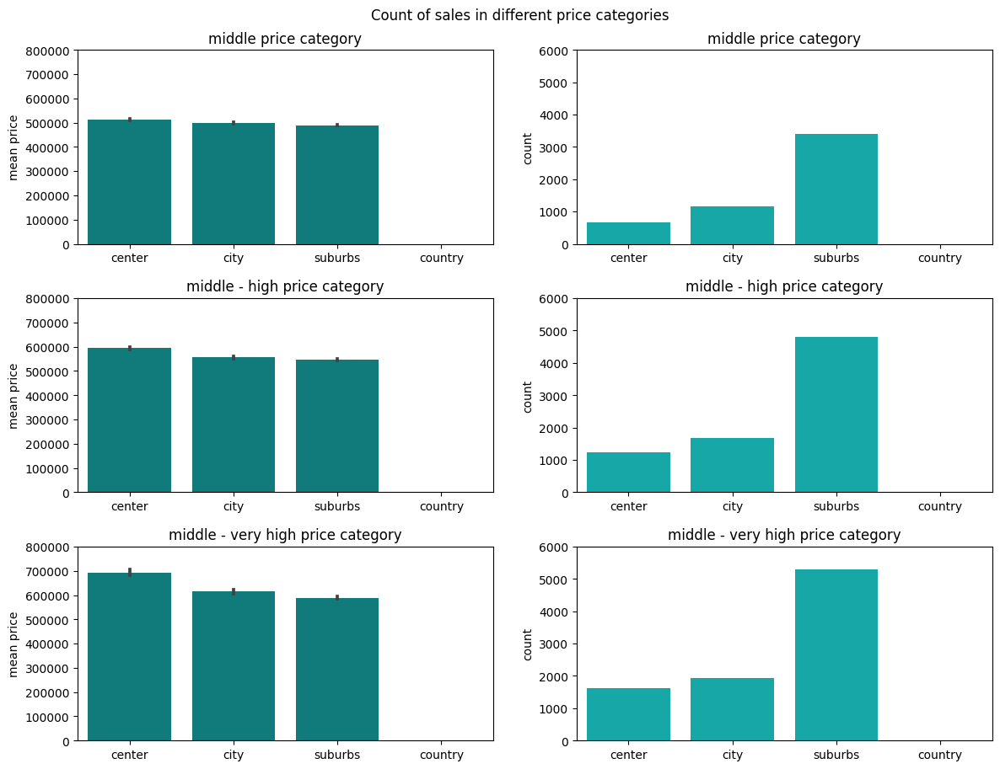

In [191]:
fig, ax = plt.subplots(3,2, figsize=(14,10))
#fig.tight_layout(h_pad=3)
fig.subplots_adjust(hspace=0.28, wspace=0.2)

# middle price range
sns.barplot(data=df_city_house.query("price_category in ['middle_price']"), x="location", y="price", ax= ax[0,0], color="darkcyan")
sns.countplot(data=df_city_house.query("price_category in ['middle_price']"), x="location", ax= ax[0,1], color="c")

# high price range
sns.barplot(data=df_city_house.query("price_category in ['middle_price','high_price']"), x="location", y="price", ax= ax[1,0], color="darkcyan")
sns.countplot(data=df_city_house.query("price_category in ['middle_price','high_price']"), x="location", ax= ax[1,1], color="c")

# very high price range
sns.barplot(data=df_city_house.query("price_category in ['middle_price','high_price','very_high_price']"), x="location", y="price", ax= ax[2,0], color="darkcyan")
sns.countplot(data=df_city_house.query("price_category in ['middle_price','high_price','very_high_price']"), x="location", ax= ax[2,1], color="c")

ax[0,0].set(xlabel="",ylabel="mean price", ylim=[0,800000])
ax[0,1].set(xlabel="", ylim=[0,6000])
ax[1,0].set(xlabel="", ylabel="mean price", ylim=[0,800000])
ax[1,1].set(xlabel="", ylim=[0,6000])
ax[2,0].set(xlabel="",ylabel="mean price", ylim=[0,800000])
ax[2,1].set(xlabel="", ylim=[0,6000])

ax[0,0].set_title("middle price category")
ax[0,1].set_title("middle price category")
ax[1,0].set_title("middle - high price category")
ax[1,1].set_title("middle - high price category")
ax[2,0].set_title("middle - very high price category")
ax[2,1].set_title("middle - very high price category")

fig.suptitle("Count of sales in different price categories")
plt.subplots_adjust(top=0.93)

<Axes: xlabel='location', ylabel='count'>

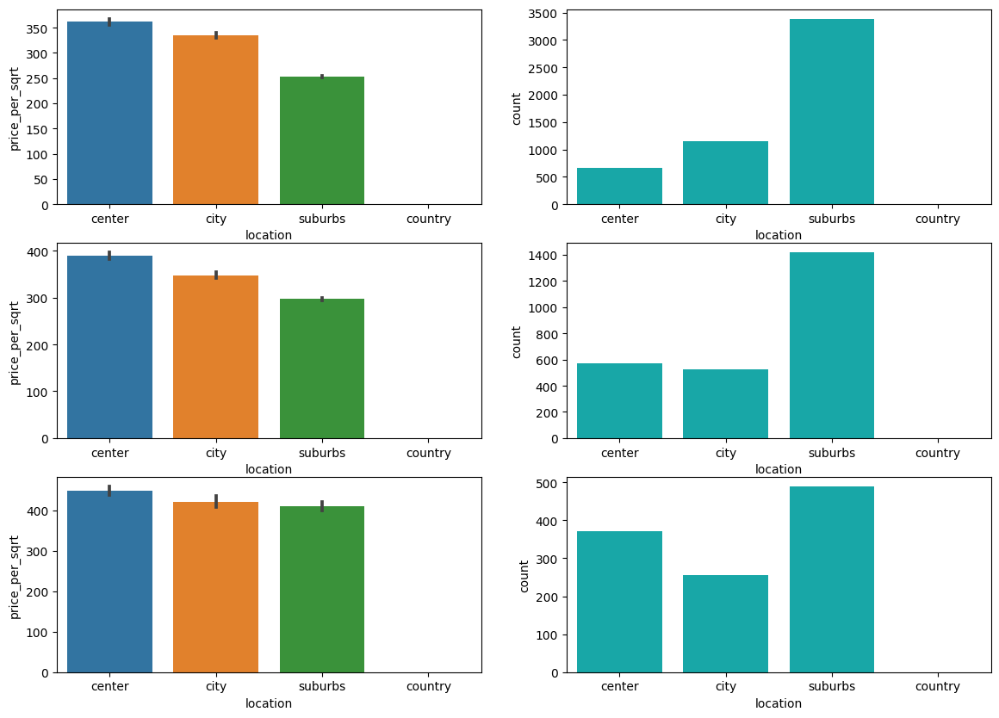

In [167]:
subfig, ax = plt.subplots(3,2, figsize=(14,10))

# middle price range
sns.barplot(data=df_city_house.query("price_category in ['middle_price']"), x="location", y="price_per_sqrt", ax= ax[0,0])
sns.countplot(data=df_city_house.query("price_category in ['middle_price']"), x="location", ax= ax[0,1], color="c")

# high price range
sns.barplot(data=df_city_house.query("price_category in ['high_price']"), x="location", y="price_per_sqrt", ax= ax[1,0])
sns.countplot(data=df_city_house.query("price_category in ['high_price']"), x="location", ax= ax[1,1], color="c")

# very high price range
sns.barplot(data=df_city_house.query("price_category in ['very_high_price']"), x="location", y="price_per_sqrt", ax= ax[2,0])
sns.countplot(data=df_city_house.query("price_category in ['very_high_price']"), x="location", ax= ax[2,1], color="c")

#### Space category

<Axes: xlabel='space_category', ylabel='count'>

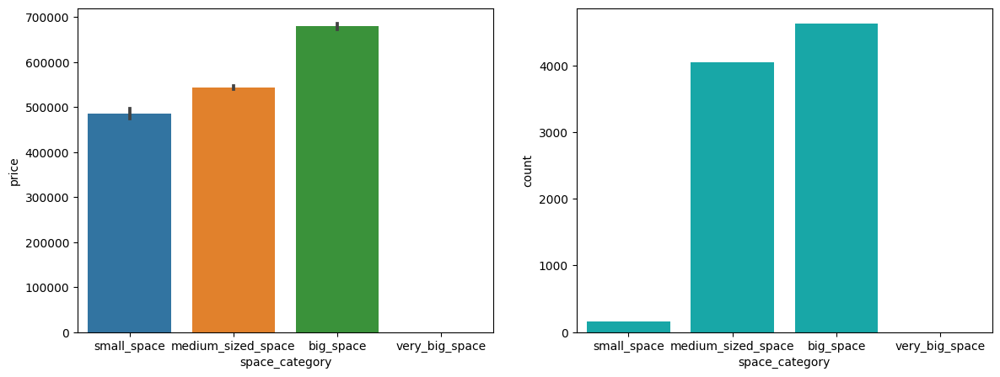

In [168]:
subfig, ax = plt.subplots(1,2, figsize=(14,5))


sns.barplot(data=df_city_house, x="space_category", y="price", ax= ax[0])
sns.countplot(data=df_city_house, x="space_category", ax= ax[1], color="c")


#### Number of bathrooms

<Axes: xlabel='bathrooms', ylabel='count'>

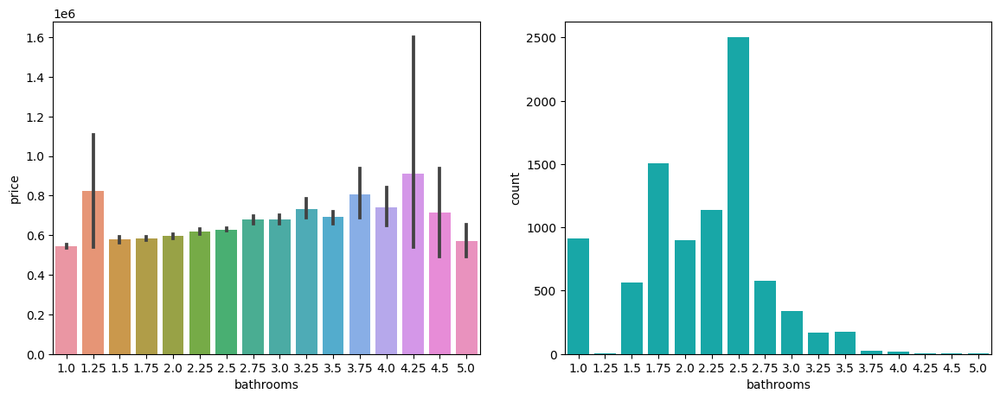

In [169]:
subfig, ax = plt.subplots(1,2, figsize=(14,5))


sns.barplot(data=df_city_house, x="bathrooms", y="price", ax= ax[0])
sns.countplot(data=df_city_house, x="bathrooms", ax= ax[1], color="c")


#### Grade

[Text(37.722222222222214, 0.5, 'mean price')]

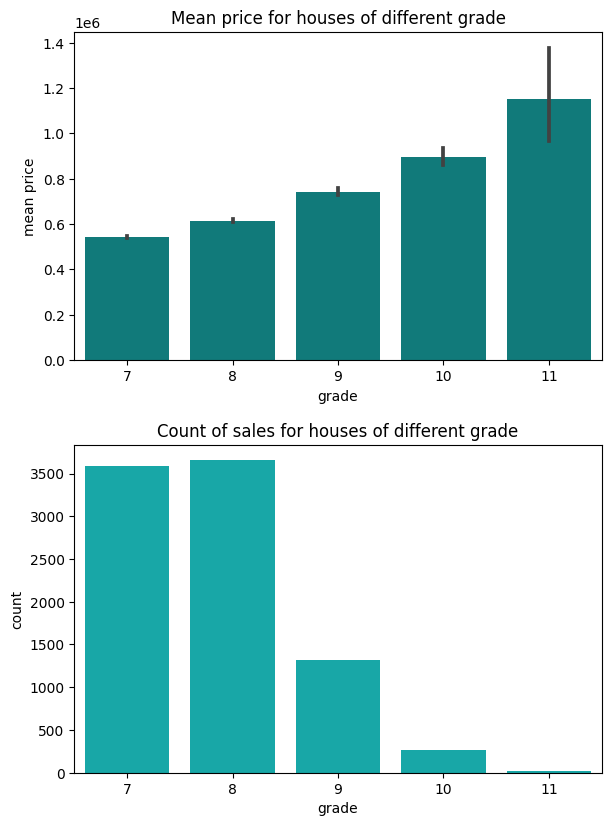

In [170]:
fig, ax = plt.subplots(2,1, figsize=(6,8))
# Set space between the subplots axis
fig.tight_layout(h_pad=4)


sns.barplot(data=df_city_house, x="grade", y="price", ax= ax[0], color="darkcyan")
sns.countplot(data=df_city_house, x="grade", ax= ax[1], color="c")

ax[0].set_title("Mean price for houses of different grade")
ax[1].set_title("Count of sales for houses of different grade")
ax[0].set(ylabel = "mean price")


#### Price over the year

<Axes: xlabel='month_of_sale', ylabel='price'>

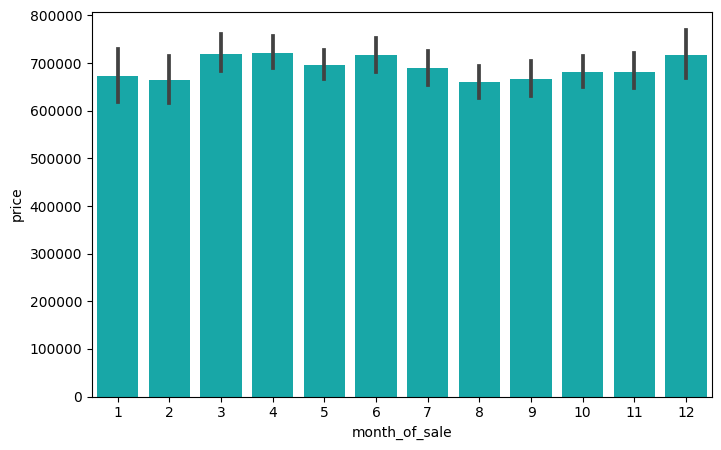

In [171]:
sns.barplot(data=df_city_house.query("location == 'center'"), x="month_of_sale", y="price", color="c")

<Axes: xlabel='season_of_sale', ylabel='price'>

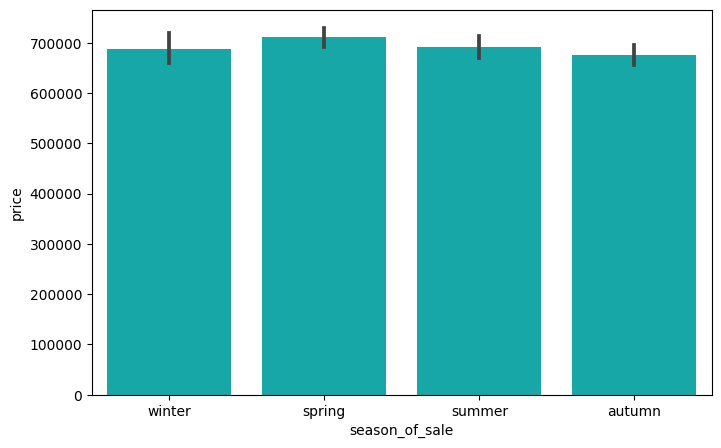

In [172]:
sns.barplot(data=df_city_house.query("location == 'center'"), x="season_of_sale", y="price", color="c")

### Country house

First we filter our data with our conditions.

In [173]:
df_country_house = df.query("location == 'country' and space_category in ['small_space','medium_sized_space','big_space'] and lot_category in ['medium_sized_lot', 'big_lot', 'small_lot'] and price_category in ['middle_price','high_price'] and condition >= 3 and grade >= 7 and bathrooms >= 1 and bedrooms >= 2")

#### Renovated

[Text(0, 0, 'non-renovated'), Text(1, 0, 'renovated')]

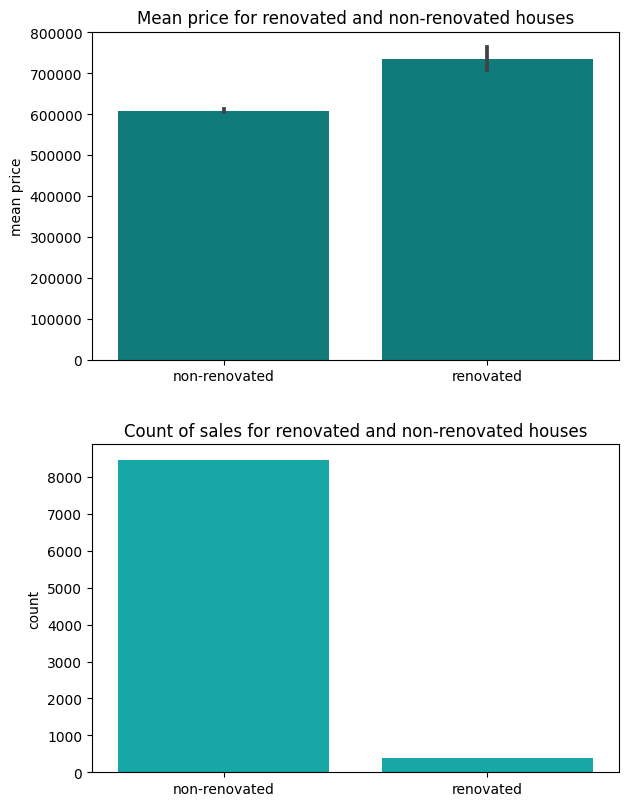

In [174]:
fig, ax = plt.subplots(2,1, figsize=(6,8))
# Set space between the subplots axis
fig.tight_layout(h_pad=4)


sns.barplot(data=df_city_house, x="is_renovated", y="price", ax= ax[0], color="darkcyan")
sns.countplot(data=df_city_house, x="is_renovated", ax= ax[1], color="c")

ax[0].set_title("Mean price for renovated and non-renovated houses")
ax[1].set_title("Count of sales for renovated and non-renovated houses")

ax[0].set(ylabel = "mean price", xlabel="")
ax[1].set(xlabel="")

ax[0].set_xticklabels(["non-renovated", "renovated"])
ax[1].set_xticklabels(["non-renovated", "renovated"])

Going for the non-renovated houses seems a good choice.  
Therefore we reduce our data set and look just at our non renovated houses.

In [175]:
df_country_house_not_reno = df_country_house.query("is_renovated == False")

#### Lot category

<Axes: xlabel='lot_category', ylabel='count'>

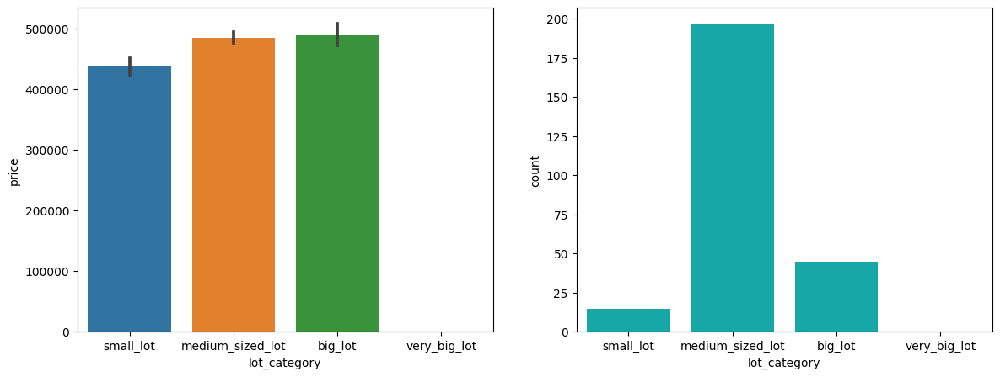

In [176]:
subfig, ax = plt.subplots(1,2, figsize=(14,5))


sns.barplot(data=df_country_house_not_reno, x="lot_category", y="price", ax= ax[0])
sns.countplot(data=df_country_house_not_reno, x="lot_category", ax= ax[1], color="c")


<Axes: xlabel='lot_category', ylabel='count'>

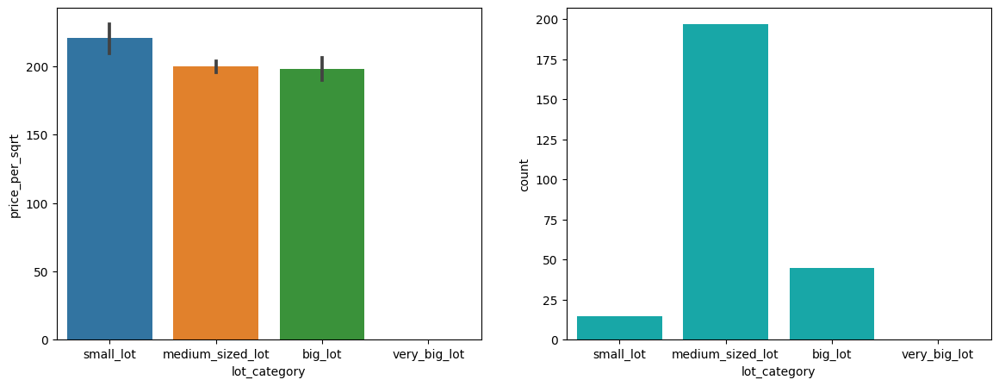

In [177]:
subfig, ax = plt.subplots(1,2, figsize=(14,5))


sns.barplot(data=df_country_house_not_reno, x="lot_category", y="price_per_sqrt", ax= ax[0])
sns.countplot(data=df_country_house_not_reno, x="lot_category", ax= ax[1], color="c")


#### Grade

<Axes: xlabel='grade', ylabel='count'>

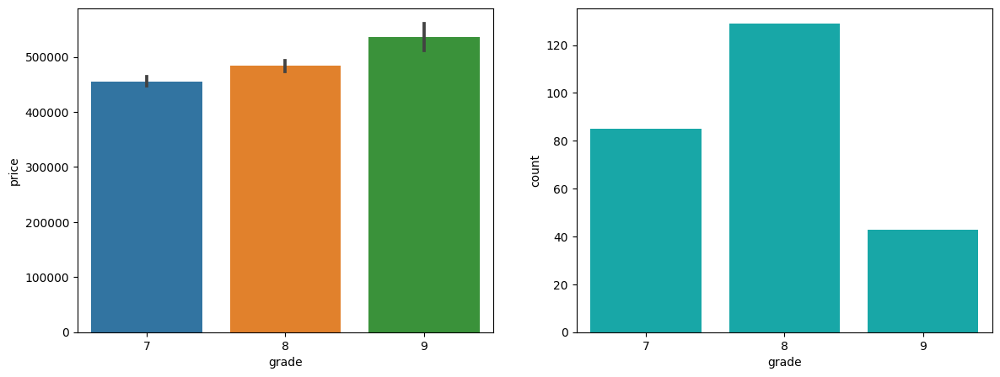

In [178]:
subfig, ax = plt.subplots(1,2, figsize=(14,5))


sns.barplot(data=df_country_house_not_reno, x="grade", y="price", ax= ax[0])
sns.countplot(data=df_country_house_not_reno, x="grade", ax= ax[1], color="c")


#### Condition

[Text(37.722222222222214, 0.5, 'mean price')]

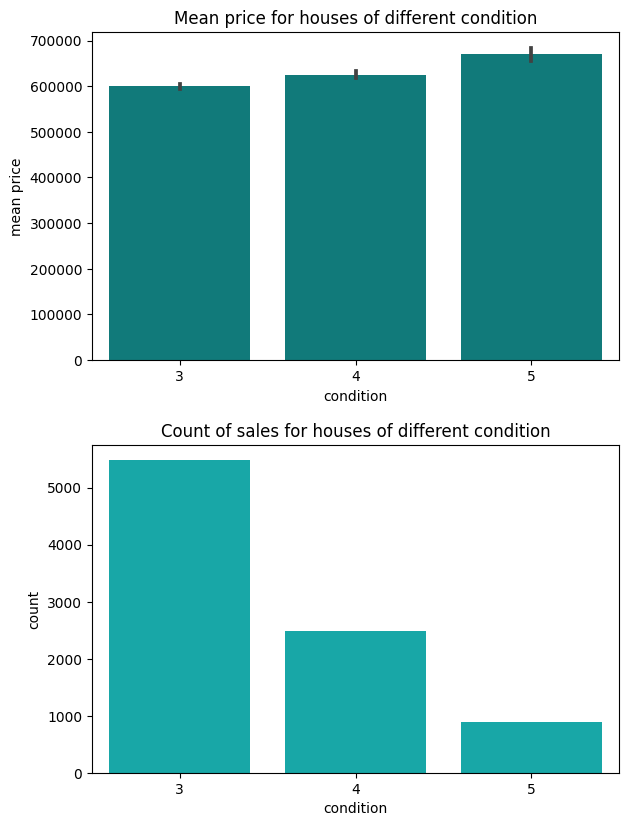

In [179]:
fig, ax = plt.subplots(2,1, figsize=(6,8))
# Set space between the subplots axis
fig.tight_layout(h_pad=4)


sns.barplot(data=df_city_house, x="condition", y="price", ax= ax[0], color="darkcyan")
sns.countplot(data=df_city_house, x="condition", ax= ax[1], color="c")

ax[0].set_title("Mean price for houses of different condition")
ax[1].set_title("Count of sales for houses of different condition")
ax[0].set(ylabel = "mean price")

<Axes: xlabel='condition', ylabel='count'>

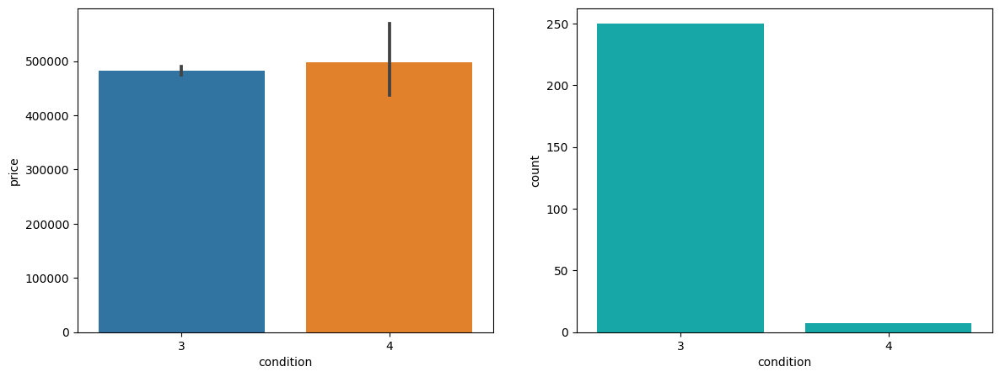

In [180]:
subfig, ax = plt.subplots(1,2, figsize=(14,5))


sns.barplot(data=df_country_house_not_reno, x="condition", y="price", ax= ax[0])
sns.countplot(data=df_country_house_not_reno, x="condition", ax= ax[1], color="c")


#### Number of bedrooms

<Axes: xlabel='bedrooms', ylabel='count'>

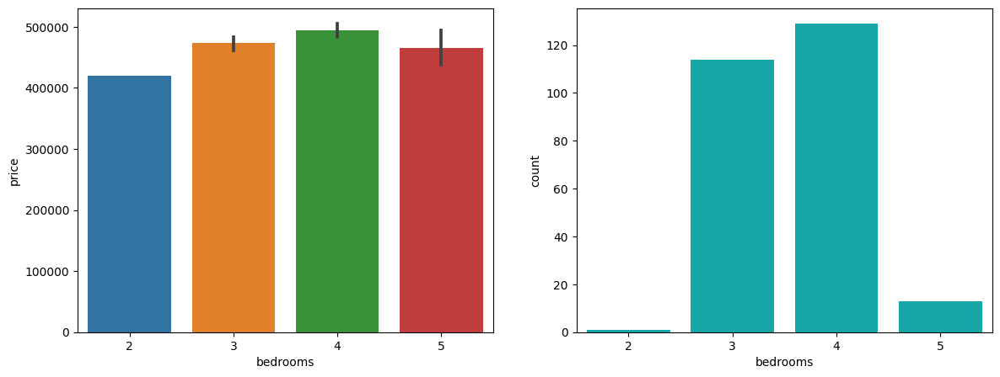

In [181]:
subfig, ax = plt.subplots(1,2, figsize=(14,5))


sns.barplot(data=df_country_house_not_reno, x="bedrooms", y="price", ax= ax[0])
sns.countplot(data=df_country_house_not_reno, x="bedrooms", ax= ax[1], color="c")


#### Number of bathrooms

<Axes: xlabel='bathrooms', ylabel='count'>

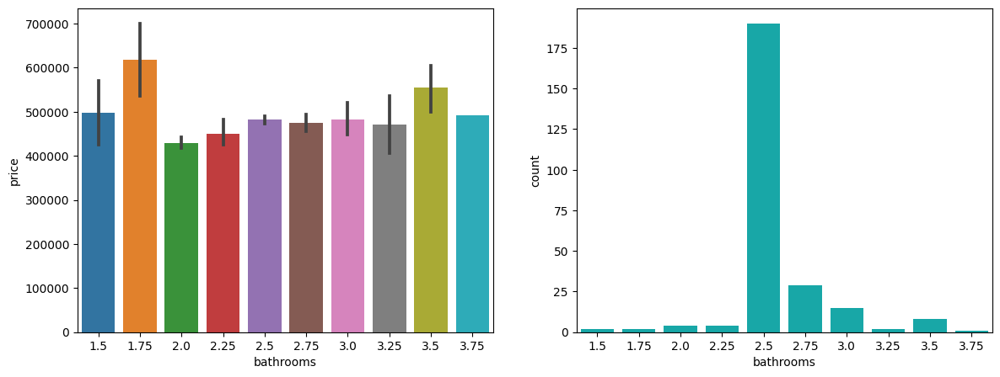

In [182]:
subfig, ax = plt.subplots(1,2, figsize=(14,5))


sns.barplot(data=df_country_house_not_reno, x="bathrooms", y="price", ax= ax[0])
sns.countplot(data=df_country_house_not_reno, x="bathrooms", ax= ax[1], color="c")


#### Price over the year

[Text(0.5, 58.7222222222222, 'month')]

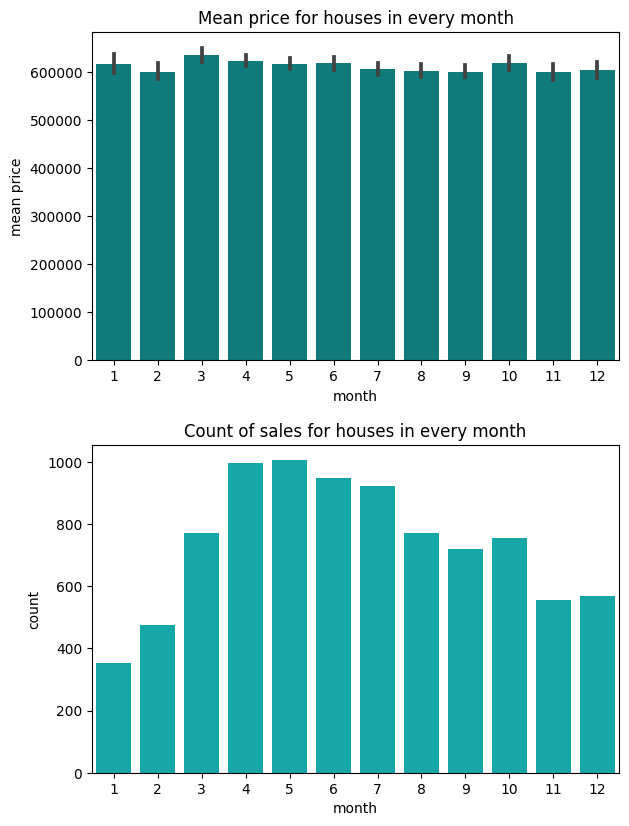

In [190]:
fig, ax = plt.subplots(2,1, figsize=(6,8))
# Set space between the subplots axis
fig.tight_layout(h_pad=4)


sns.barplot(data=df_city_house, x="month_of_sale", y="price", ax= ax[0], color="darkcyan")
sns.countplot(data=df_city_house, x="month_of_sale", ax= ax[1], color="c")

ax[0].set_title("Mean price for houses in every month")
ax[1].set_title("Count of sales for houses in every month")
ax[0].set(ylabel = "mean price", xlabel = "month")
ax[1].set(xlabel = "month")

<Axes: xlabel='month_of_sale', ylabel='price'>

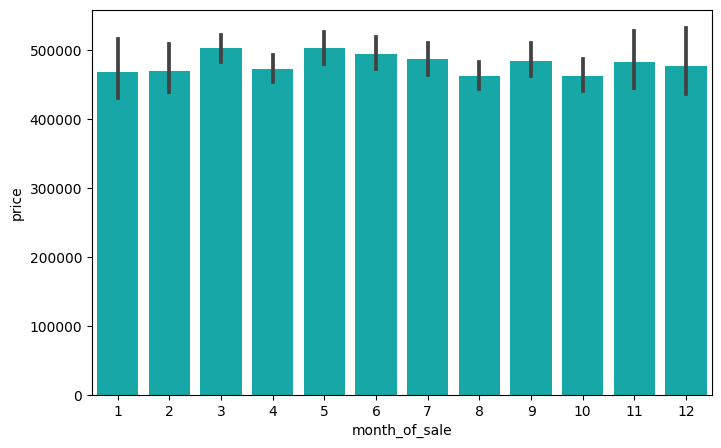

In [184]:
sns.barplot(data=df_country_house_not_reno, x="month_of_sale", y="price", color="c")

<Axes: xlabel='month_of_sale', ylabel='count'>

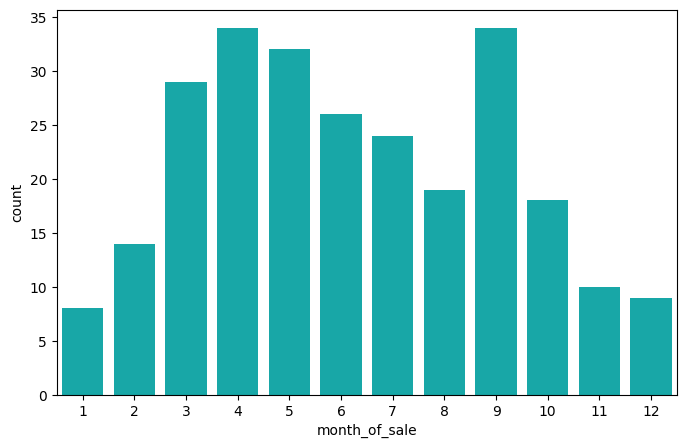

In [185]:
sns.countplot(data=df_country_house_not_reno, x="month_of_sale", color="c")

## Findings
add explanations and overviews document your thought process.. WHY did you do all the analysis?

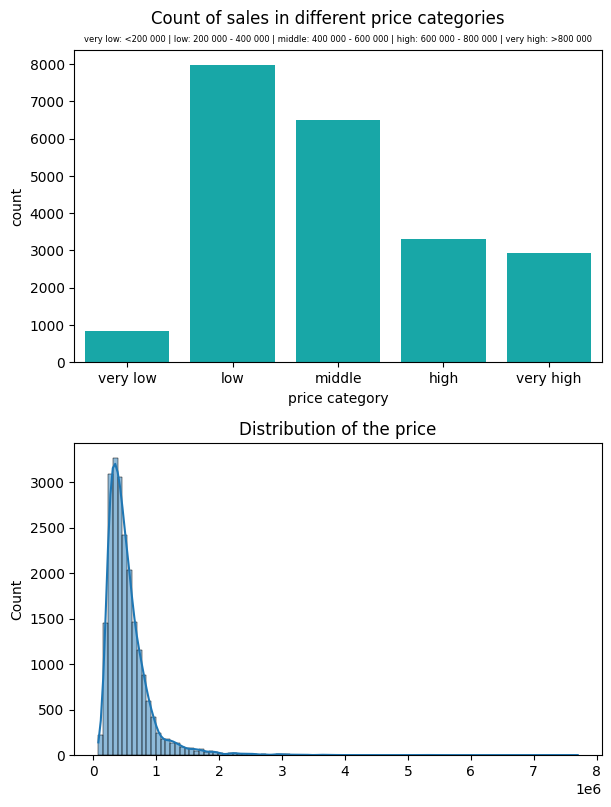

In [186]:
fig, ax = plt.subplots(2,1, figsize=(6,8))
# Set space between the subplots axis
fig.tight_layout(h_pad=4)

sns.histplot(df[["price"]], bins = 100, ax= ax[1], kde=True, color="darkcyan", legend=False)

sns.countplot(x=df["price_category"], color="c", ax=ax[0])

ax[0].set(xlabel = "price category")

ax[0].set_xticklabels(["very low", "low", "middle","high", "very high"])

ax[1].set_title("Distribution of the price")
ax[0].set_title("very low: <200 000 | low: 200 000 - 400 000 | middle: 400 000 - 600 000 | high: 600 000 - 800 000 | very high: >800 000", fontdict={'size': 6})

fig.suptitle("Count of sales in different price categories")
plt.subplots_adjust(top=0.93)


Text(0.5, 0.98, 'Distribution of lot and living space')

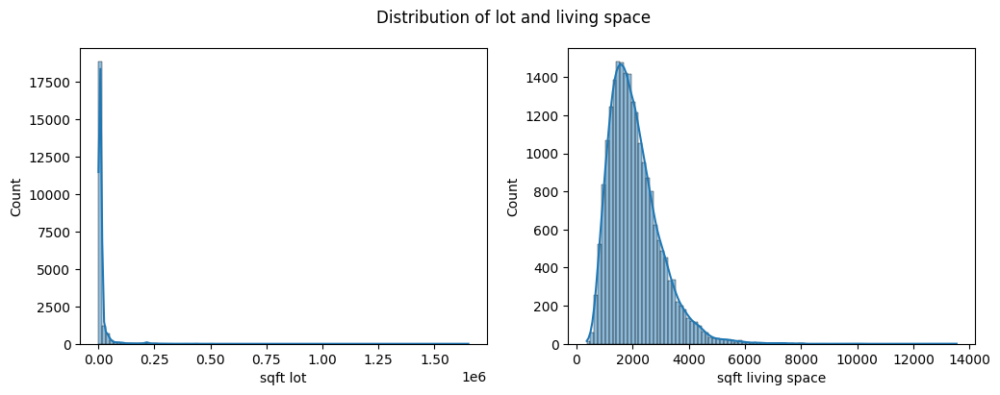

In [187]:
# Initialize the matplotlib figure
fig, ax = plt.subplots(1,2, figsize=(12,4))

sns.histplot(df[["sqft_lot"]], bins = 100, ax= ax[0], kde=True, legend=False, color="darkcyan")
sns.histplot(df[["sqft_living"]], bins = 100, ax= ax[1], kde=True, legend=False, color="cadetblue");

ax[0].set(xlabel = "sqft lot")
ax[1].set(xlabel = "sqft living space")

fig.suptitle('Distribution of lot and living space')


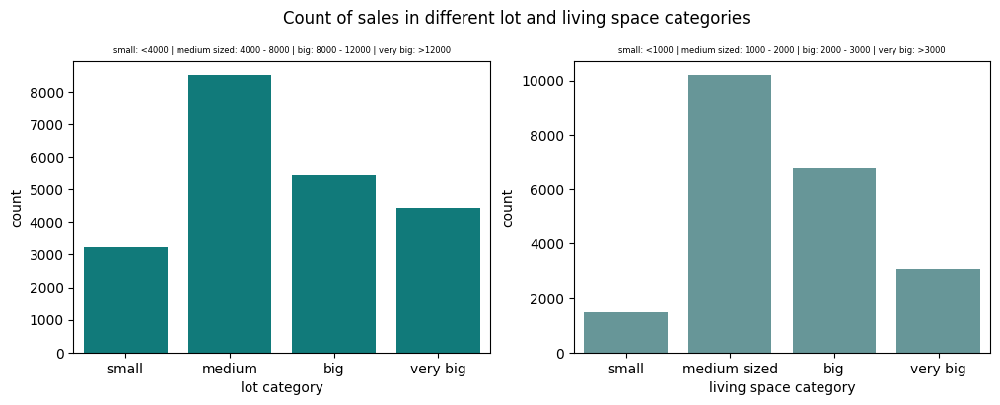

In [188]:
fig, ax = plt.subplots(1,2, figsize=(12,4))

sns.countplot(x=df["lot_category"], ax= ax[0], color="darkcyan")
sns.countplot(x=df["space_category"], ax= ax[1], color="cadetblue");

ax[0].set(xlabel = "lot category")
ax[1].set(xlabel = "living space category")

ax[0].set_xticklabels(["small", "medium", "big", "very big"])
ax[1].set_xticklabels(["small", "medium sized", "big", "very big"])

ax[0].set_title("small: <4000 | medium sized: 4000 - 8000 | big: 8000 - 12000 | very big: >12000", fontdict={'size': 6})
ax[1].set_title("small: <1000 | medium sized: 1000 - 2000 | big: 2000 - 3000 | very big: >3000", fontdict={'size': 6})

fig.suptitle('Count of sales in different lot and living space categories')
plt.subplots_adjust(top=0.85)
